## 1️⃣ Configuration

In [1]:
#Data_Handling_Libraries
import os                                                      # File system operations
import json                                                    # Working with JSON files
import pandas as pd                                            # Tabular data handling
import numpy as np                                             # Numerical operations
import xarray as xr                                            # Multi-dimensional labeled data
import dask                                                    # Parallel computing and lazy evaluation
import netCDF4 as nc                                           # Reading netCDF files (common in climate science)

#Machine_Learning_Libraries
from sklearn.metrics import mean_squared_error, r2_score       # Model evaluation metrics
from sklearn.model_selection import train_test_split           # Splitting data
from xgboost import XGBRegressor                               # XGBoost regressor
import shap                                                    # SHAP values for model explainability
import joblib                                                  # Model saving/loading

#Visualization_Libraries
import matplotlib.pyplot as plt                                # Plotting library
from matplotlib import ticker                                  # Customizing axis ticks
import matplotlib.colors as mcolors                            # Handling color maps
import seaborn as sns                                          # Statistical data visualization
 
#Geospatial_Tools
import cartopy.feature as cfeature                             # Map features like coastlines, borders
import cartopy.crs as ccrs                                     # Coordinate reference systems
import rioxarray as rxr                                        # Spatial raster data handling with xarray
from rasterio.merge import merge                               # Merge multiple raster files
from rasterio.plot import show                                 # Plotting raster data
from geopy.distance import geodesic                            # Compute geographic distance

#Utility_Libraries
from tqdm import tqdm                                          # Progress bars for loops
import random                                                  # Random number generation


C:\Users\Iman\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 2️⃣ Preprocessing

<h1>Import Data</h1>

In [2]:
path = 'C:/Iman/Maxm'  #path = '/leonardo_work/mBI23_AmbCo_1/igoudarz'
iyear = list(range(2001, 2021))

In [3]:
#Are you going to do SHAP Analysis?
shap = "NO"  # or "YES"

if shap == "NO":
    var_surface_input_list = ['total_column_cloud_ice_water_daymean','total_precipitation_daycum','camr_daymean']
else:
    var_surface_input_list = [
         'total_column_cloud_ice_water_daymean',
         'total_precipitation_daycum',
         'camr_daymean',
         
         '10m_u_component_of_wind_daymean',
         '10m_v_component_of_wind_daymean',
         '2m_dewpoint_temperature_daymean',
         '2m_temperature_daymax',
         'convective_available_potential_energy_daymax',
         'geopotential_daymean',
         'k_index_daymean',
         'mean_surface_latent_heat_flux_daymean',
         'mean_surface_sensible_heat_flux_daymean',
         'mean_vertically_integrated_moisture_divergence_daymean',
         'sea_surface_temperature_daymean',
         'surface_pressure_daymean',
         'toa_incident_solar_radiation_daymean',
         'total_column_cloud_liquid_water_daymean',
         'total_column_water_vapour_daymean',
         'total_totals_index_daymean',
         'vertical_integral_of_eastward_water_vapour_flux_daymean',
         'vertical_integral_of_northward_water_vapour_flux_daymean',
         'volumetric_soil_water_layer_1_daymean',
         'temperature_daymean',
         'u_component_of_wind_daymean',
         'v_component_of_wind_daymean',
         'vertical_velocity_daymean',
         'vorticity_daymean',
         'q2m_daymean',
         'bs_daymax',
         'WVT_daymean']

<h2>Era5 (2001_2021)</h2>

In [4]:
# List to store the merged datasets for each variable
merged_datasets = []
for var in var_surface_input_list:
    datasets = []
    for year in iyear:
        # Open the dataset for the current variable and year
        ds = xr.open_dataset(f"{path}/ERA5_NearestN/{var}_{year}_NearestN.nc")
        ds = ds.isel(bnds=0)
        datasets.append(ds)
    # Merge all datasets for the current variable
    merged_var_dataset = xr.merge(datasets)
    merged_datasets.append(merged_var_dataset)
# Combine all merged variable datasets into a single xarray.Dataset
era5_Imerg = xr.merge(merged_datasets)

In [5]:
#Importing era5 conservative remapping dataset
merged_datasets = []

datasets = []
for year in iyear:
    # Open the dataset for the current variable and year
    ds = xr.open_dataset(f"{path}/ERA5_consmap/total_precipitation_daycum_{year}_consmap.nc")
    ds = ds.isel(bnds=0)
    datasets.append(ds)

# Merge all datasets for the current variable
merged_var_dataset = xr.merge(datasets)
merged_datasets.append(merged_var_dataset)

# Combine all merged variable datasets into a single xarray.Dataset
era5_ppt_era5 = xr.merge(merged_datasets)
era5_ppt_era5 = era5_ppt_era5.rename({'tp': 'ppt_era5'})
era5_ppt_era5['ppt_era5']=era5_ppt_era5['ppt_era5']*1000 
##########################################################################################à
#merge with main DS
era5_Imerg = xr.merge([era5_Imerg, era5_ppt_era5], compat='override')
era5_Imerg = era5_Imerg.drop_vars('time_bnds')
#exclude data less than 0
era5_Imerg["ppt_era5"] = xr.where(era5_Imerg["ppt_era5"] > 0, era5_Imerg["ppt_era5"], 0)
era5_Imerg["tciw"] = xr.where(era5_Imerg["tciw"] > 0, era5_Imerg["tciw"], 0)

In [6]:
#furthur modifications
era5_Imerg['lat'] = era5_Imerg['lat'].round(2).astype(float)
era5_Imerg['lon'] = era5_Imerg['lon'].round(2).astype(float)

era5_Imerg = era5_Imerg.rename({'tp': 'tp_NearestN'})
era5_Imerg['tp_NearestN'] = era5_Imerg['tp_NearestN'] * 1000

if shap != "NO":
    era5_Imerg = era5_Imerg.rename({'z': 'geopotential/9.81'})  
    era5_Imerg['geopotential/9.81'] = era5_Imerg['geopotential/9.81'] / 9.81  

    era5_Imerg = era5_Imerg.rename({'p71.162': 'viewvf'})  
    era5_Imerg = era5_Imerg.rename({'p72.162': 'vinwvf'})  
    pass  

#Units
era5_Imerg["ppt_era5"].attrs["units"] = "mm" 
era5_Imerg["camr"].attrs["units"] = "unitless"
era5_Imerg["tciw"].attrs["units"] = "kg m**-2"

if shap != "NO":
    era5_Imerg["cape"] = xr.where(era5_Imerg["cape"] > 0, era5_Imerg["cape"], 0)  
    era5_Imerg["tp_NearestN"].attrs["units"] = "mm"       
    era5_Imerg["bs"].attrs["units"] = "m s**-1"           
    era5_Imerg["cape"].attrs["units"] = "J kg**-1"
    era5_Imerg["q2m"].attrs["units"] = "kg/kg"            
    era5_Imerg["WVT"].attrs["units"] = "m s**-1"  
    pass  

<h2>Era5_backintime (1960_2000)</h2>

In [7]:
selected_variables_backintime= ['camr', 'total_column_cloud_ice_water']

In [ ]:
############1960-1983################
merged_datasets = []
for var in selected_variables_backintime:
    datasets = []
    for year in range (1960,1984): 
        ds=xr.open_dataset(f"{path}/ERA5_hourly_backintime/{var}_{year}_daymean_NN.nc")
        ds = ds.isel(bnds=0)
        ds = ds.rename({"valid_time": "time"})
        datasets.append(ds)
    # Merge all datasets for the current variable
    merged_var_dataset = xr.merge(datasets)
    merged_datasets.append(merged_var_dataset)
    
# Combine all merged variable datasets into a single xarray.Dataset
era5_backintime_1960_1983 = xr.merge(merged_datasets)

In [9]:
############1983-2000################
merged_datasets = []
for var in selected_variables_backintime:
    datasets = []
    for year in range (1984,2001): 
        ds=xr.open_dataset(f"{path}/ERA5_NearestN/{var}_daymean_{year}_NearestN.nc") #,chunks={"time": 1}
        ds = ds.isel(bnds=0)
        #ds = ds.rename({"valid_time": "time"})
        datasets.append(ds)
    # Merge all datasets for the current variable
    merged_var_dataset = xr.merge(datasets)
    merged_datasets.append(merged_var_dataset)
    
# Combine all merged variable datasets into a single xarray.Dataset
era5_backintime_1984_2000 = xr.merge(merged_datasets)
############1960-2000################
era5_backintime = xr.merge([era5_backintime_1960_1983, era5_backintime_1984_2000]) #, compat='override'
    

In [10]:
############1960-1983################
merged_datasets = []
for var in ['total_precipitation']:
    datasets = []
    for year in range (1960,1984):
        ds=xr.open_dataset(f"{path}/ERA5_hourly_backintime/{var}_{year}_daysum_consmap.nc")
        ds = ds.isel(bnds=0)
        ds = ds.rename({"valid_time": "time"})
        ds = ds.rename({'tp': 'ppt_era5'})
        ds['ppt_era5']=ds['ppt_era5']*1000   #convert to mm/d
        ds["ppt_era5"].attrs["units"] = "mm"
        datasets.append(ds)
    # Merge all datasets for the current variable
    merged_var_dataset = xr.merge(datasets)
    merged_datasets.append(merged_var_dataset)
# Combine all merged variable datasets into a single xarray.Dataset
era5_tp_backintime_1960_1983 = xr.merge(merged_datasets)

In [11]:
############1984-2000################
merged_datasets = []
for var in ['total_precipitation']:
    datasets = []
    for year in range (1984,2001):
        ds=xr.open_dataset(f"{path}/ERA5_consmap/{var}_daycum_{year}_consmap.nc")
        ds = ds.isel(bnds=0)
        #ds = ds.rename({"valid_time": "time"})
        ds = ds.rename({'tp': 'ppt_era5'})
        ds['ppt_era5']=ds['ppt_era5']*1000   #convert to mm/d
        ds["ppt_era5"].attrs["units"] = "mm"
        datasets.append(ds)
    # Merge all datasets for the current variable
    merged_var_dataset = xr.merge(datasets)
    merged_datasets.append(merged_var_dataset)
# Combine all merged variable datasets into a single xarray.Dataset
era5_tp_backintime_1984_2000 = xr.merge(merged_datasets)
############1960-2000################
era5_tp_backintime = xr.merge([era5_tp_backintime_1960_1983, era5_tp_backintime_1984_2000]) #, compat='override'

In [ ]:
# IMPORT ETOPO

ds = xr.open_dataset(f"{path}/ETOPO_2022_v1_30s_N90W180_surface_Imerg_conservative_remapped.nc", engine="netcdf4")
# Select the latitude and longitude ranges
ETOPO_consmap_Z = ds.sel(lat=slice(43, 49), lon=slice(4, 19))

expanded_z = xr.concat([ETOPO_consmap_Z['z']] * len(era5_Imerg.time), dim='time')
# Create a new DataArray 
new_data_array = xr.DataArray(
    expanded_z,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lat'],
        'lon': era5_Imerg.coords['lon']})

# Assign the new DataArray to the era5 dataset
era5_Imerg['ETOPO_consmap_z'] = new_data_array
era5_Imerg['ETOPO_consmap_z'] = era5_Imerg['ETOPO_consmap_z'].where(era5_Imerg['ETOPO_consmap_z'] >= 0, 0)
############################################################################################################
# Repeat the z data along the time dimension to match the length of era5_data_daily time dimension
expanded_z = xr.concat([ETOPO_consmap_Z['z']] * len(era5_tp_backintime.time), dim='time')
# Create a new DataArray 
new_data_array = xr.DataArray(
    expanded_z,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_tp_backintime.coords['time'],
        'lat': era5_tp_backintime.coords['lat'],
        'lon': era5_tp_backintime.coords['lon']})

# Assign the new DataArray to the era5 backintime dataset
era5_tp_backintime['ETOPO_consmap_z'] = new_data_array
era5_tp_backintime['ETOPO_consmap_z'] = era5_tp_backintime['ETOPO_consmap_z'].where(era5_tp_backintime['ETOPO_consmap_z'] >= 0, 0)

In [ ]:
era5_backintime = xr.merge([era5_backintime, era5_tp_backintime]) #, compat='override'
#removing 29th of Feb to have a same data for all years
era5_backintime = era5_backintime.sel(time=~((era5_backintime['time'].dt.month == 2) & (era5_backintime['time'].dt.day == 29)))
era5_backintime["camr"].attrs["units"] = "unitless"
era5_backintime = era5_backintime.drop_vars('valid_time_bnds')
# Round to 6 decimal places
era5_backintime['lat'] = era5_backintime['lat'].round(2).astype(float)
era5_backintime['lon'] = era5_backintime['lon'].round(2).astype(float)

era5_backintime


<xarray.Dataset> Size: 2GB
Dimensions:          (time: 14965, lon: 150, lat: 60)
Coordinates:
  * time             (time) datetime64[ns] 120kB 1960-01-01T11:30:00 ... 2000...
  * lon              (lon) float64 1kB 4.05 4.15 4.25 4.35 ... 18.75 18.85 18.95
  * lat              (lat) float64 480B 43.05 43.15 43.25 ... 48.75 48.85 48.95
Data variables:
    camr             (time, lat, lon) float32 539MB 0.001481 ... 0.0004967
    tciw             (time, lat, lon) float32 539MB 0.0001221 ... 0.0119
    time_bnds        (time) datetime64[ns] 120kB NaT NaT ... 2000-12-31
    ppt_era5         (time, lat, lon) float32 539MB 0.1159 0.1323 ... 1.014
    ETOPO_consmap_z  (time, lat, lon) float32 539MB 0.0 0.0 0.0 ... 471.2 672.8
Attributes:
    CDI:                     Climate Data Interface version 2.0.4 (https://mp...
    Conventions:             CF-1.7
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Tue Jan 28 09:58:22 2025: cdo remapnn,/mnt/c/Ima...
    frequency:               day
    CDO:                     Climate Data Operators version 2.0.4 (https://mp...

<h2>IMERG Dataset</h2>

In [15]:
dates = pd.date_range(start="2001-01-01", end="2020-12-31", freq="D")
# Enable dask to manage datasets lazily
merged_datasets = []
for date in dates:
    try:
        i = date.strftime("%Y%m%d")  
        # Open the dataset with dask for lazy loading
        ds = xr.open_dataset(f"{path}/IMERG7_CDO/CDO_Precipitation_3B-DAY.MS.MRG.3IMERG.{i}-S000000-E235959.V07B.nc4", 
                             engine="netcdf4", chunks={'time': 1}) 
        ds = ds['precipitation']
        merged_datasets.append(ds)
    except FileNotFoundError:
        print(f"File not found for {i}, skipping...")
# Merge datasets lazily
Imerg_orgres_dask = xr.concat(merged_datasets, dim='time')
Imerg_orgres_dask=Imerg_orgres_dask.transpose('time', 'lat', 'lon')
# Create a new DataArray for train/test indices
era5_Imerg['Imerg_orgres'] = xr.DataArray(
    Imerg_orgres_dask.compute().values,
    dims=['time', 'lat','lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lon'],
        'lon': era5_Imerg.coords['lat']})

#Other Modifications
#removing 29th of Feb to have a same data for all years
era5_Imerg = era5_Imerg.sel(time=~((era5_Imerg['time'].dt.month == 2) & (era5_Imerg['time'].dt.day == 29)))
# Create a custom list of 365 day indices (or labels)
custom_dayofyear = np.tile(np.arange(1, 366), len(np.unique(era5_Imerg['time'].dt.year.values)))
# Assign this custom day index as a new coordinate
era5_Imerg = era5_Imerg.assign_coords(custom_dayofyear=("time", custom_dayofyear))
#assign the unit to IMERG pp
era5_Imerg["Imerg_orgres"].attrs["units"] = "mm"

<h2>IMERG Quality Index</h2>

In [16]:
#Import QI data

file_list = [os.path.join(path, "QI_CDO", f) for f in os.listdir(os.path.join(path, "QI_CDO")) if f.endswith('.nc4')]
ds_QI_hour = xr.open_mfdataset(file_list,combine='by_coords',chunks={'time': 24}, parallel=True,cache=False)
############################################################
ds_QI_hour=ds_QI_hour.drop_vars('time_bnds')
ds_QI_hour=ds_QI_hour.compute()
ds_QI_hour['lat'] = ds_QI_hour['lat'].round(2).astype(float)
ds_QI_hour['lon'] = ds_QI_hour['lon'].round(2).astype(float)
##########################################################
#convert hourly to daily
ds_QI_resamp = ds_QI_hour.resample(time='1D').mean()
###########################################################
#starting from 2001 to be compatible with era5_Imerg
ds_QI_resamp = ds_QI_resamp.sel(time=slice('2001', None))
#Transpose 
ds_QI_resamp=ds_QI_resamp.transpose('time', 'lat', 'lon')
#removing 29th of Feb to have a same data for all years
ds_QI_resamp = ds_QI_resamp.sel(time=~((ds_QI_resamp['time'].dt.month == 2) & (ds_QI_resamp['time'].dt.day == 29)))
# Create a custom list of 365 day indices (or labels)
custom_dayofyear = np.tile(np.arange(1, 366), len(np.unique(ds_QI_resamp['time'].dt.year.values)))
# Assign this custom day index as a new coordinate
ds_QI_resamp = ds_QI_resamp.assign_coords(custom_dayofyear=("time", custom_dayofyear))
# round the long, lat a constant number
ds_QI_resamp['lat'] = ds_QI_resamp['lat'].round(2).astype(float)
ds_QI_resamp['lon'] =ds_QI_resamp['lon'].round(2).astype(float)
ds_QI_resamp['time'] = era5_Imerg['time']
#mere resampled QI into our era5-Imerg
era5_Imerg = xr.merge([era5_Imerg, ds_QI_resamp])


<h2>Additional Modifications</h2>

In [17]:
#seasonal labaling
era5_Imerg['Seasonal Mask'] = xr.where(era5_Imerg['time.month'].isin([12, 1, 2]), 'winter',
    xr.where(era5_Imerg['time.month'].isin([3, 4, 5]), 'spring',
        xr.where(era5_Imerg['time.month'].isin([6, 7, 8]), 'summer',
            xr.where(era5_Imerg['time.month'].isin([9, 10, 11]), 'fall', None))))
#########################################################################################################################
#necessary variables for plotting
era5_long = era5_Imerg.variables["lon"][:]
era5_lat  = era5_Imerg.variables["lat"][:]
era5_elev= era5_Imerg['ETOPO_consmap_z'][0,:,:]
era5_Imerg


<xarray.Dataset> Size: 2GB
Dimensions:                    (time: 7300, lon: 150, lat: 60)
Coordinates:
  * time                       (time) datetime64[ns] 58kB 2001-01-01T11:00:00...
  * lon                        (lon) float64 1kB 4.05 4.15 4.25 ... 18.85 18.95
  * lat                        (lat) float64 480B 43.05 43.15 ... 48.85 48.95
    custom_dayofyear           (time) int32 29kB 1 2 3 4 5 ... 362 363 364 365
Data variables:
    tciw                       (time, lat, lon) float32 263MB 0.003961 ... 0....
    tp_NearestN                (time, lat, lon) float32 263MB 0.1367 ... 0.05329
    camr                       (time, lat, lon) float32 263MB 0.001835 ... 0....
    ppt_era5                   (time, lat, lon) float32 263MB 0.1367 ... 0.05329
    ETOPO_consmap_z            (time, lat, lon) float32 263MB 0.0 0.0 ... 672.8
    Imerg_orgres               (time, lat, lon) float32 263MB 0.61 ... 0.035
    precipitationQualityIndex  (time, lat, lon) float32 263MB 0.6412 ... 0.7227
    Seasonal Mask              (time) object 58kB 'winter' 'winter' ... 'winter'
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu Oct 03 16:44:23 2024: cdo remapnn,/mnt/c/Iman/Maxm/Imer...
    frequency:    day
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...

<h2> Visualization of variables</h2>

In [18]:
#plot colour and size modification for the poster

crs = ccrs.PlateCarree()
custom_cmap = mcolors.LinearSegmentedColormap.from_list("white_to_blue", ["white", "blue"])


def map_m_fig(fig, m_array, elev, lon, lat, lev_max=3000, lev_range=500, title_fig="title fig", m_unit=r"angular coefficient m $[year^{-1}]$", extr=None, chosen_map="RdBu_r", vmin=None, vmax=None):
    ## extremes of colormap
    m_not_nan = np.nan_to_num(m_array)
    if extr is None:
        extr = np.max((np.abs(m_not_nan.min()), m_not_nan.max()))

    # label height
    levels = np.arange(0, lev_max, lev_range)

    ax = fig.add_subplot(projection=crs)
    contour = ax.contour(lon, lat, elev, levels, colors='k', linewidths=0.5)
    ax.add_feature(cfeature.COASTLINE)
    
    title_color = '#000000'  # Title color
    plt.title(title_fig, fontsize=20, fontweight='bold', color=title_color)  # Increased title font size
    
    if vmin is None:
        vmin = -extr
    if vmax is None:
        vmax = extr
    im = plt.pcolormesh(lon, lat, m_not_nan, vmin=vmin, vmax=vmax, cmap=chosen_map)
    
    # Gridlines with larger font size and same color as title
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, x_inline=False, y_inline=False, linewidth=0.33, color='k', alpha=0.5)
    gl.right_labels = gl.top_labels = False
    gl.xlabel_style = {'size': 15, 'color': title_color}
    gl.ylabel_style = {'size': 15, 'color': title_color}

    # Colorbar with larger font size and same color as title
    cax = fig.add_axes([ax.get_position().x1 + 0.01, ax.get_position().y0, 0.02, ax.get_position().height])
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label(m_unit, fontsize=15, color=title_color)
    
    # Set the colorbar background to transparent by setting its frame face color to None
    cbar.outline.set_edgecolor('none')  # Hide the colorbar outline
    
    # Remove the background face color for both the axes and colorbar
    cbar.ax.patch.set_facecolor('none')  # Set the colorbar facecolor to none
    ax.patch.set_facecolor('none')       # Set the axes facecolor to none
    
    # Update colorbar tick labels and ticks to match title color and size
    cbar.ax.yaxis.set_tick_params(labelsize=15, color=title_color)  # Adjust size and color of tick labels
    cbar.ax.yaxis.set_tick_params(which='both', width=2, color=title_color)  # Adjust width and color of ticks
    plt.setp(cbar.ax.get_yticklabels(), color=title_color)  # Set tick labels color to match title

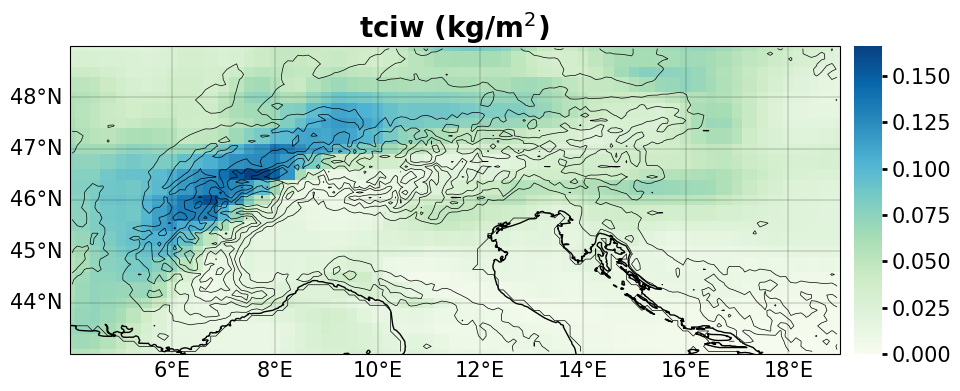

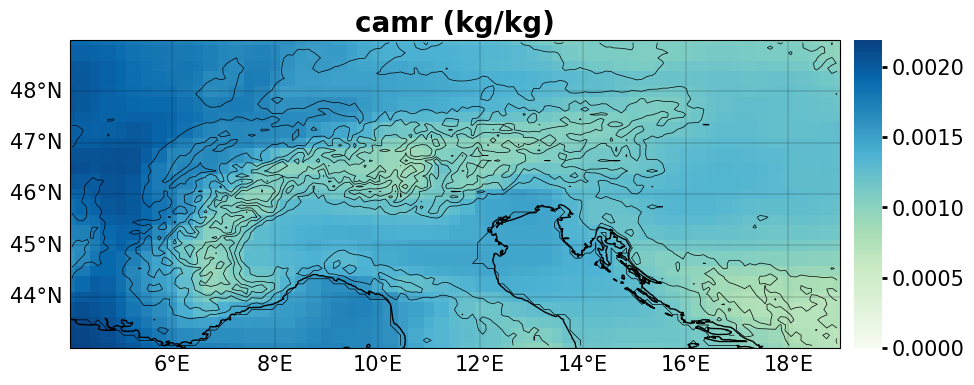

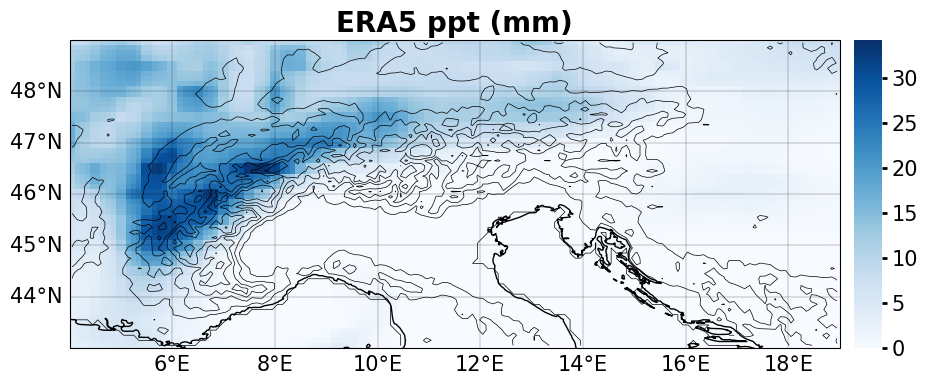

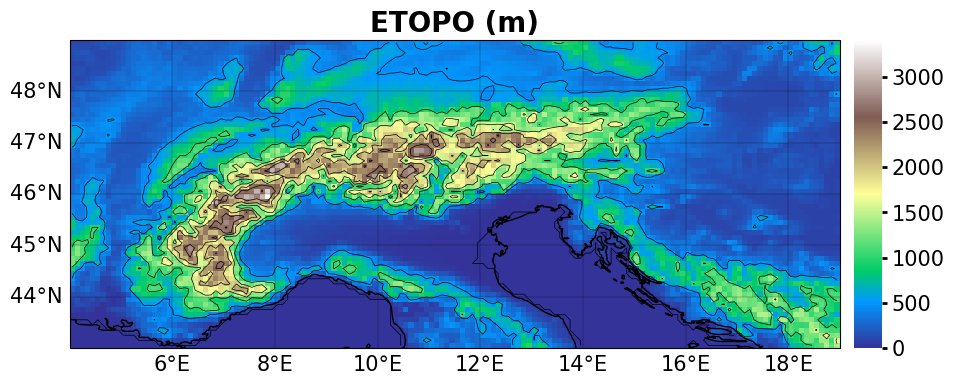

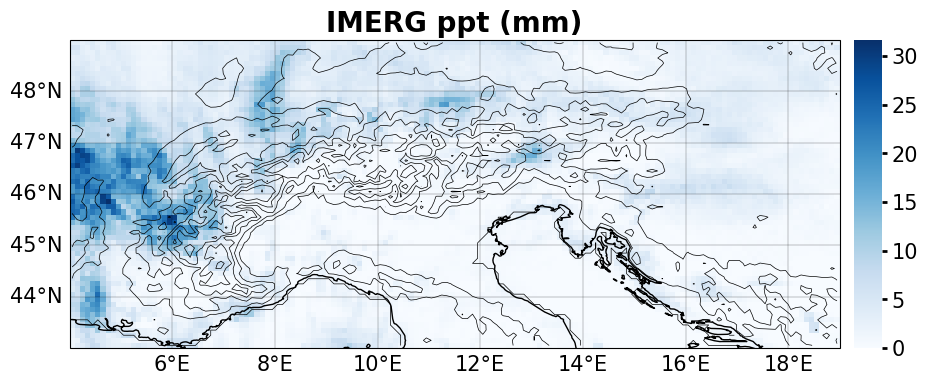

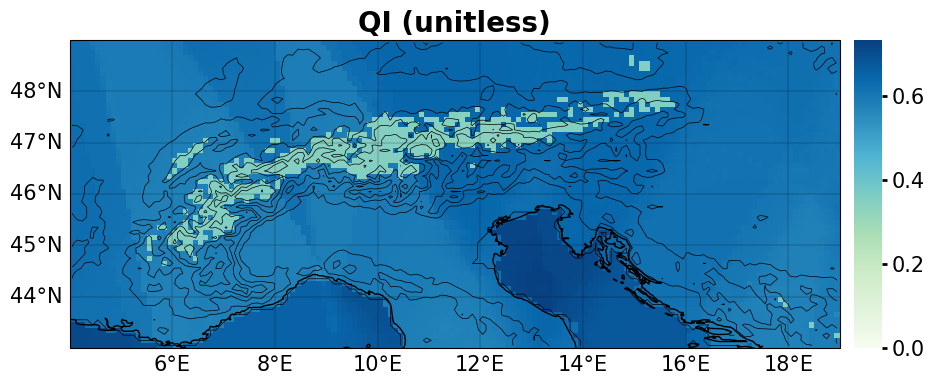

In [ ]:
selected_time='2002-11-09'
excluded_vars = ["Rain/No rain threshold","Imerg P with threshold","tp_NearestN","Seasonal Mask"]
included_vars = [var for var in era5_Imerg.data_vars if var not in excluded_vars]

for var in included_vars:
    fig = plt.figure(figsize=(14, 4))
    unit=era5_Imerg[var].attrs.get('units', 'unitless')
    vars_positive = ['totalx', 'tp_NearestN'] #'cape', 'tclw', 'tciw', 'tcwv', 'totalx', 'swvl1', 'tp_NearestN', 'q2m','bs'
    data = era5_Imerg[var].sel(time=selected_time)[0,:,:]
    
    
    if var in vars_positive:
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} ({unit})', m_unit='', chosen_map="GnBu", vmin=0)
    
    
    elif var == 'WVT':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (m/s)', m_unit='', chosen_map="GnBu")
    elif var == 'vo':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (1/s)', m_unit='', chosen_map="GnBu")
    elif var == 'w':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (Pa/s)', m_unit='', chosen_map="GnBu")
    elif var == 'u' or var == 'u10' or var == 'v' or var == 'v10':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (m/s)', m_unit='', chosen_map="GnBu")
    elif var == 'vinwvf' or var == 'viewvf':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (kg/m.s)', m_unit='', chosen_map="GnBu")
    elif var == 'mslhf' or var == 'msshf':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=fr'{var} (w/m$^2$)', m_unit='', chosen_map="GnBu")
    elif var == 'mvimd':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat, title_fig=f'{var} (kg/m$^2$.s)', m_unit='', chosen_map="GnBu")
    
    elif var == 'bs':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} (m/s)', m_unit='', chosen_map="GnBu", vmin=0)
        
    elif var == 'q2m':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} (kg/kg)', m_unit='', chosen_map="GnBu", vmin=0)
        
    elif var == 'cape':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} (j/kg)', m_unit='', chosen_map="GnBu", vmin=0)
        
    elif var == 'swvl1':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=fr'{var} (m$^3$/m$^3$)', m_unit='', chosen_map="GnBu", vmin=0)
        
    elif var == 'tclw' or var == 'tciw' or var == 'tcwv':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=fr'{var} (kg/m$^2$)', m_unit='', chosen_map="GnBu", vmin=0)
        
    elif var == 'd2m' or var == 't2m':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} ({unit})', m_unit='', chosen_map="GnBu", vmin=250, vmax=300)

    elif var == 'sp':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} ({unit})', m_unit='', chosen_map="GnBu", vmin=80000, vmax=100000)

    elif var == 'tisr':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=fr'{var} (j/m$^2$)', m_unit='', chosen_map="GnBu", vmin=500000, vmax=900000)

    elif var == 't':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} ({unit})', m_unit='', chosen_map="GnBu", vmin=250, vmax=280)
        
    elif var == 'Imerg_orgres':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                title_fig=f'IMERG ppt ({unit})', m_unit='', chosen_map="Blues", vmin=0)
    
    elif var == 'ppt_era5':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                title_fig=f'ERA5 ppt ({unit})', m_unit='', chosen_map="Blues", vmin=0)
    
    elif var == 'ETOPO_consmap_z':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                title_fig=f'ETOPO (m)', m_unit='', chosen_map="terrain", vmin=0)
        
    elif var == 'camr':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                title_fig=f'camr (kg/kg)', m_unit='', chosen_map="GnBu", vmin=0)
    
    elif var == 'precipitationQualityIndex':
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                title_fig=f'QI (unitless)', m_unit='', chosen_map="GnBu", vmin=0)
        
    else:
        map_m_fig(fig, data.values, era5_elev, era5_long, era5_lat,
                  title_fig=f'{var} ({unit})', m_unit='', chosen_map="GnBu")
        


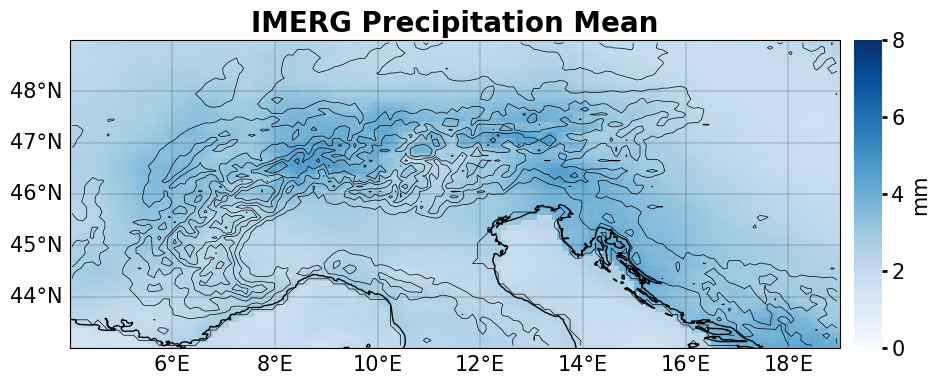

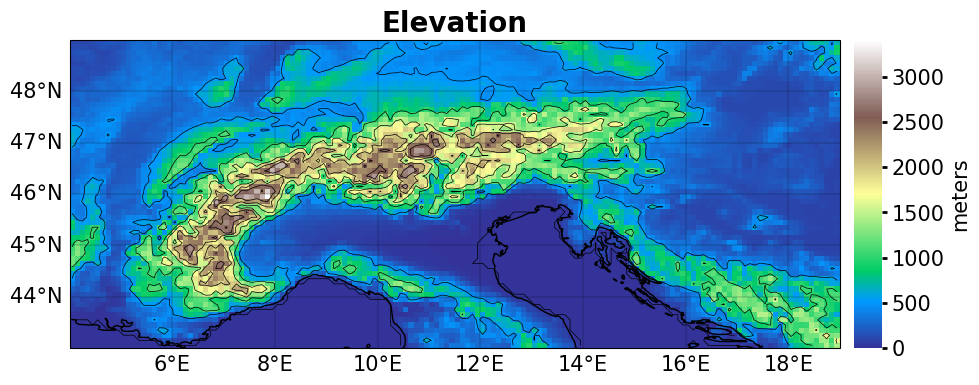

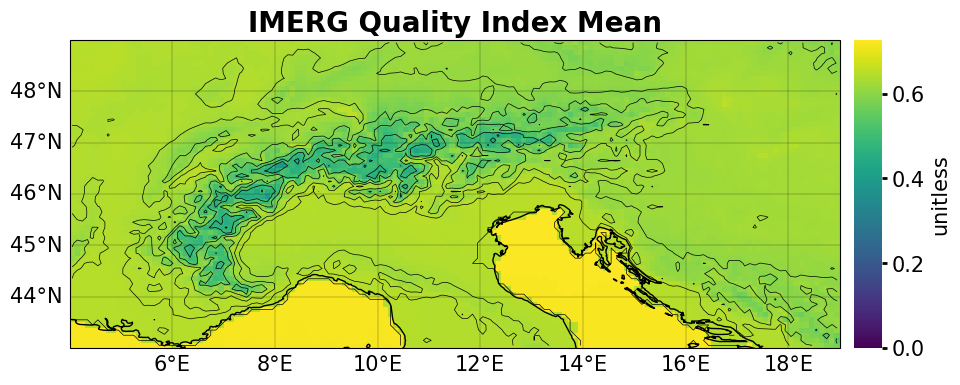

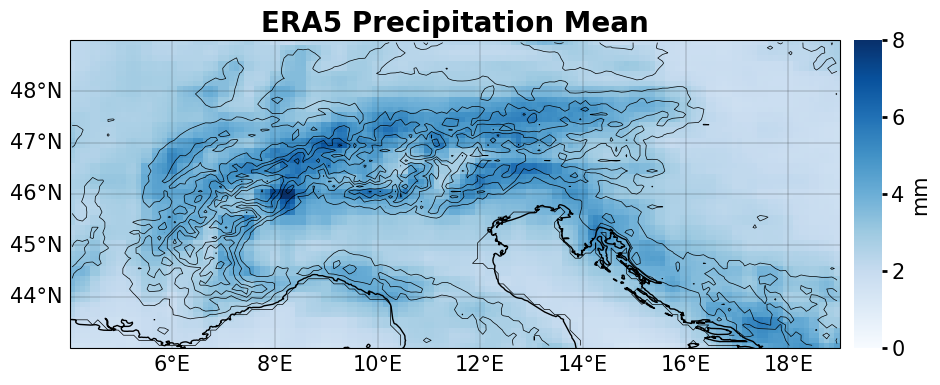

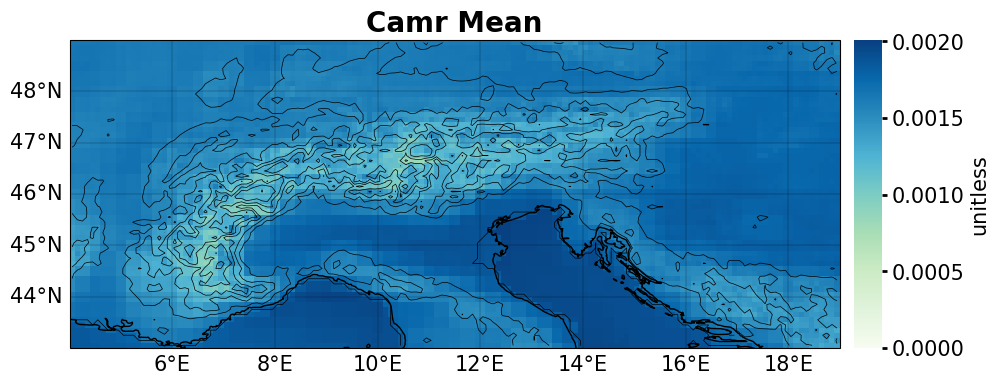

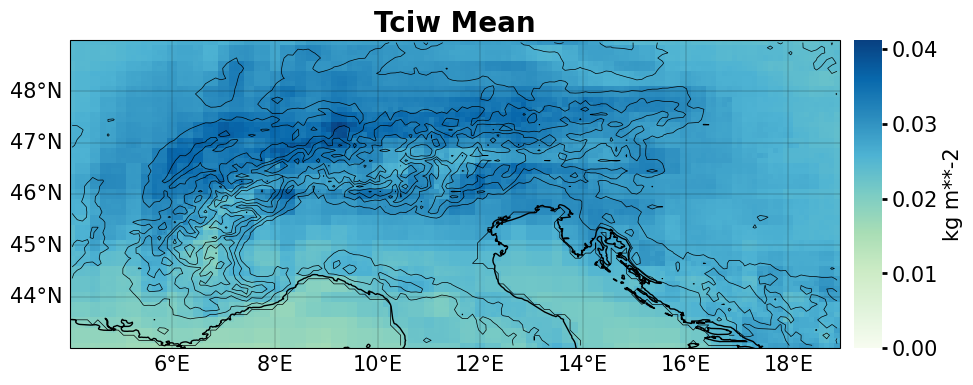

In [20]:
mask= (era5_Imerg['precipitationQualityIndex'] >= 0.6)
    
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["Imerg_orgres"].where(mask,drop=True).mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'IMERG Precipitation Mean', m_unit=era5_Imerg["Imerg_orgres"].attrs.get('units', 'unitless'), chosen_map="Blues", vmin=0, vmax=8)
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["ETOPO_consmap_z"].mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'Elevation', m_unit=era5_Imerg["ETOPO_consmap_z"].attrs.get('units', 'unitless'), chosen_map="terrain", vmin=0)
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["precipitationQualityIndex"].mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'IMERG Quality Index Mean', m_unit=era5_Imerg["precipitationQualityIndex"].attrs.get('units', 'unitless'), chosen_map="viridis", vmin=0)
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["ppt_era5"].where(mask,drop=True).mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'ERA5 Precipitation Mean', m_unit=era5_Imerg["ppt_era5"].attrs.get('units', 'unitless'), chosen_map="Blues", vmin=0, vmax=8)
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["camr"].where(mask,drop=True).mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'Camr Mean', m_unit=era5_Imerg["camr"].attrs.get('units', 'unitless'), chosen_map="GnBu", vmin=0)
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["tciw"].where(mask,drop=True).mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'Tciw Mean', m_unit=era5_Imerg["tciw"].attrs.get('units', 'unitless'), chosen_map="GnBu", vmin=0)


C:\Users\Iman\AppData\Local\Temp\ipykernel_22892\1543843445.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


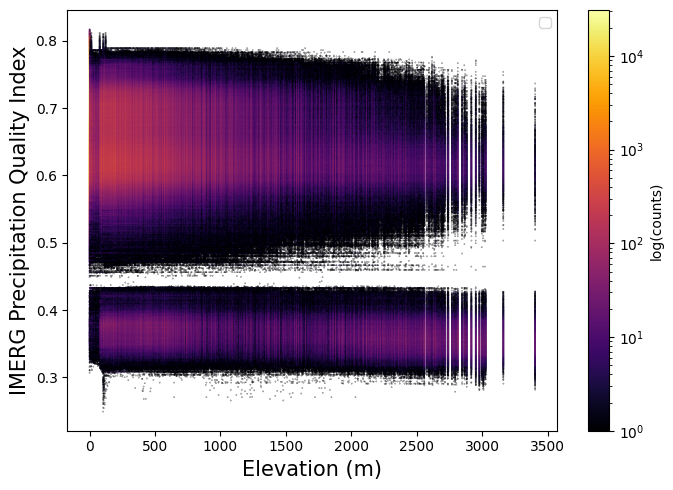

In [ ]:
x = era5_Imerg['ETOPO_consmap_z'].values.flatten()  #
y = era5_Imerg['precipitationQualityIndex'].values.flatten()

# Plot hexbin + linear regression
plt.figure(figsize=(7, 5))
plt.hexbin(x, y, mincnt=1, gridsize=2000, bins='log', cmap='inferno')  # mincnt=1 to avoid sparse hexes
plt.colorbar(label='log(counts)')
plt.xlabel("Elevation (m)", fontsize=15)
plt.ylabel("IMERG Precipitation Quality Index", fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
#plt.title("Precipitation Quality Index vs Elevation")
plt.legend()
plt.tight_layout()
plt.show()


Count below 0.6: 15135949
Percentage below 0.6: 23.04%


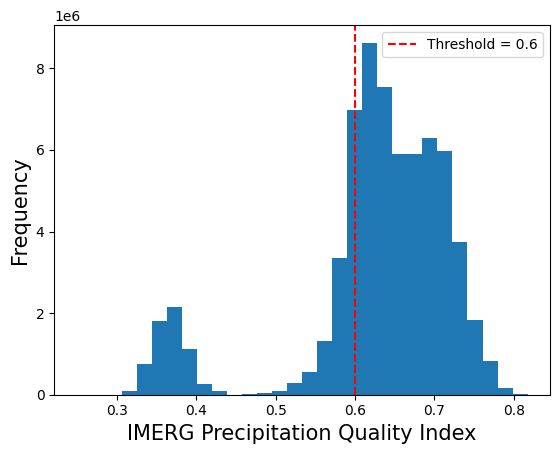

In [22]:
# Flatten the data
pq_index = era5_Imerg['precipitationQualityIndex'].values.flatten()

# Remove NaNs if present
pq_index = pq_index[~np.isnan(pq_index)]

# Count values below 0.6
below_threshold = pq_index < 0.6
count_below = np.sum(below_threshold)
total_count = len(pq_index)
percentage_below = (count_below / total_count) * 100

# Print results
print(f"Count below 0.6: {count_below}")
print(f"Percentage below 0.6: {percentage_below:.2f}%")
# Plot histogram
plt.hist(pq_index, bins=30)
plt.axvline(x=0.6, color='red', linestyle='--', label='Threshold = 0.6')
plt.legend()
plt.xlabel('IMERG Precipitation Quality Index',fontsize=15)
plt.ylabel('Frequency',fontsize=15)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
#plt.title('Histogram of Imerg Precipitation Quality Index')
plt.show()

## 3️⃣ Machine Learning 

<h1> Feature Selection</h1>


<h2>Shap</h2>

In [23]:
'''
selected_variables=['tciw','u10', 'v10', 'd2m', 't2m', 'cape', 'ETOPO_consmap_z', 'kx', 'mslhf', 'msshf',
           'sp', 'tisr', 'tcwv', 'totalx', 'viewvf', 'vinwvf', 'WVT','ppt_era5',
           'swvl1', 't', 'u', 'v', 'vo', 'q2m', 'camr', 'bs','mvimd','w', 'tclw'] #, 'cin', 'sst',,,,



# fall, winter, spring, summer
#season= 'spring'
#era5_Imerg = era5_Imerg.where(era5_Imerg["Seasonal Mask"]==season, drop=True)

Y=era5_Imerg["Imerg_orgres"].values     #Y.shape=(.., 60, 150)
X = np.stack([era5_Imerg[var].values for var in selected_variables], axis=-1)   #X.shape=(.., 60, 150, 5)
'''

'\nselected_variables=[\'tciw\',\'u10\', \'v10\', \'d2m\', \'t2m\', \'cape\', \'ETOPO_consmap_z\', \'kx\', \'mslhf\', \'msshf\',\n           \'sp\', \'tisr\', \'tcwv\', \'totalx\', \'viewvf\', \'vinwvf\', \'WVT\',\'ppt_era5\',\n           \'swvl1\', \'t\', \'u\', \'v\', \'vo\', \'q2m\', \'camr\', \'bs\',\'mvimd\',\'w\', \'tclw\'] #, \'cin\', \'sst\',,,,\n\n\n\n# fall, winter, spring, summer\n#season= \'spring\'\n#era5_Imerg = era5_Imerg.where(era5_Imerg["Seasonal Mask"]==season, drop=True)\n\nY=era5_Imerg["Imerg_orgres"].values     #Y.shape=(.., 60, 150)\nX = np.stack([era5_Imerg[var].values for var in selected_variables], axis=-1)   #X.shape=(.., 60, 150, 5)\n'

In [24]:
#daily_wise data split
'''
# split into training, validation, and test sets (randomized split) based on the 'time' dimension
time_indices = np.arange(Y.shape[0])  # Array of time indices

# Randomly split the time indices into train, validation, and test sets
time_train, time_temp = train_test_split(time_indices, test_size=0.4, random_state=42)  # 40% for temp set (validation + test)
time_valid, time_test = train_test_split(time_temp, test_size=0.5, random_state=42)     # 50% validation, 50% test from temp set

# Create an array for holding the train/valid/test indices based on 'time'
train_test_indices = np.full((Y.shape[0], Y.shape[1], Y.shape[2]), 'unassigned', dtype=object)

# Mark entire days (time steps) as train, valid, or test
train_test_indices[time_train, :, :] = 'train'  # Mark all lat/lon points for the train time steps
train_test_indices[time_valid, :, :] = 'valid'  # Mark all lat/lon points for the valid time steps
train_test_indices[time_test, :, :] = 'test'    # Mark all lat/lon points for the test time steps

# Create a new DataArray for the train/valid/test indices with the original dimensions
era5_Imerg['Train/Valid/Test indices'] = xr.DataArray(
    train_test_indices,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lat'],
        'lon': era5_Imerg.coords['lon']
    }
)


# Extract the training data based on time_train indices
X_train = X[time_train, :, :, :]  
y_train = Y[time_train, :, :]

# Extract the validation data based on time_valid indices
X_valid = X[time_valid, :, :, :]  
y_valid = Y[time_valid, :, :]     

# Extract the test data based on time_test indices
X_test = X[time_test, :, :, :]   
y_test = Y[time_test, :, :] 
  
# Display the updated dataset
era5_Imerg
'''

"\n# split into training, validation, and test sets (randomized split) based on the 'time' dimension\ntime_indices = np.arange(Y.shape[0])  # Array of time indices\n\n# Randomly split the time indices into train, validation, and test sets\ntime_train, time_temp = train_test_split(time_indices, test_size=0.4, random_state=42)  # 40% for temp set (validation + test)\ntime_valid, time_test = train_test_split(time_temp, test_size=0.5, random_state=42)     # 50% validation, 50% test from temp set\n\n# Create an array for holding the train/valid/test indices based on 'time'\ntrain_test_indices = np.full((Y.shape[0], Y.shape[1], Y.shape[2]), 'unassigned', dtype=object)\n\n# Mark entire days (time steps) as train, valid, or test\ntrain_test_indices[time_train, :, :] = 'train'  # Mark all lat/lon points for the train time steps\ntrain_test_indices[time_valid, :, :] = 'valid'  # Mark all lat/lon points for the valid time steps\ntrain_test_indices[time_test, :, :] = 'test'    # Mark all lat/lon p

In [25]:
#Train
'''
#Mask of QI
Mask_train=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'train')
#X
X_masked = [era5_Imerg[var].where(Mask_train, drop=False).values for var in selected_variables]
X_train_QI = np.stack(X_masked, axis=-1)
#y
y_train_QI = era5_Imerg['Imerg_orgres'].where(Mask_train, drop=False).values
print(X_train_QI.shape)
print(y_train_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_train_QI) & ~np.isnan(X_train_QI).any(axis=-1)
X_train_QI = X_train_QI[mask_valid]
y_train_QI = y_train_QI[mask_valid]
print(X_train_QI.shape)
print(y_train_QI.shape)
#################################################
#Test
#Mask of QI
Mask_test=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'test')
#X
X_masked = [era5_Imerg[var].where(Mask_test, drop=False).values for var in selected_variables]
X_test_QI = np.stack(X_masked, axis=-1)
#y
y_test_QI = era5_Imerg['Imerg_orgres'].where(Mask_test, drop=False).values
print(X_test_QI.shape)
print(y_test_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_test_QI) & ~np.isnan(X_test_QI).any(axis=-1)
X_test_QI = X_test_QI[mask_valid]
y_test_QI = y_test_QI[mask_valid]
print(X_test_QI.shape)
print(y_test_QI.shape)
#################################################
#valid
#Mask of QI
Mask_valid=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'valid')
#X
X_masked = [era5_Imerg[var].where(Mask_valid, drop=False).values for var in selected_variables]
X_valid_QI = np.stack(X_masked, axis=-1)
#y
y_valid_QI = era5_Imerg['Imerg_orgres'].where(Mask_valid, drop=False).values
print(X_valid_QI.shape)
print(y_valid_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_valid_QI) & ~np.isnan(X_valid_QI).any(axis=-1)
X_valid_QI = X_valid_QI[mask_valid]
y_valid_QI = y_valid_QI[mask_valid]
print(X_valid_QI.shape)
print(y_valid_QI.shape)
'''

"\n#Mask of QI\nMask_train=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'train')\n#X\nX_masked = [era5_Imerg[var].where(Mask_train, drop=False).values for var in selected_variables]\nX_train_QI = np.stack(X_masked, axis=-1)\n#y\ny_train_QI = era5_Imerg['Imerg_orgres'].where(Mask_train, drop=False).values\nprint(X_train_QI.shape)\nprint(y_train_QI.shape)\n#####eliminating NA####\nmask_valid = ~np.isnan(y_train_QI) & ~np.isnan(X_train_QI).any(axis=-1)\nX_train_QI = X_train_QI[mask_valid]\ny_train_QI = y_train_QI[mask_valid]\nprint(X_train_QI.shape)\nprint(y_train_QI.shape)\n#################################################\n#Test\n#Mask of QI\nMask_test=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'test')\n#X\nX_masked = [era5_Imerg[var].where(Mask_test, drop=False).values for var in selected_variables]\nX_test_QI = np.stack(X_masked, axis=-1)\n#y\ny_test_QI = era5_Imerg['Imerg_orgres'].wher

In [26]:
# Define XGBoost regressor
'''
xgb = XGBRegressor(random_state=42, n_jobs=-1) #**best_params,
xgb.fit(X_train_QI, y_train_QI)

yxgb_flat = xgb.predict(X.reshape(-1, X.shape[-1]))
yxgb = yxgb_flat.reshape(-1,Y.shape[1],Y.shape[2])

yxgb_test_flat = xgb.predict(X_test_QI)
r2_xgb = r2_score(y_test_QI, yxgb_test_flat)
rmse_xgb = mean_squared_error(y_test_QI, yxgb_test_flat, squared=False)
print(f'R² XGBoost: {r2_xgb}')
print(f'rmse XGBoost: {rmse_xgb}')
print(X.shape)
print(X_test_QI.shape)
print(X_test.shape)
'''

"\nxgb = XGBRegressor(random_state=42, n_jobs=-1) #**best_params,\nxgb.fit(X_train_QI, y_train_QI)\n\nyxgb_flat = xgb.predict(X.reshape(-1, X.shape[-1]))\nyxgb = yxgb_flat.reshape(-1,Y.shape[1],Y.shape[2])\n\nyxgb_test_flat = xgb.predict(X_test_QI)\nr2_xgb = r2_score(y_test_QI, yxgb_test_flat)\nrmse_xgb = mean_squared_error(y_test_QI, yxgb_test_flat, squared=False)\nprint(f'R² XGBoost: {r2_xgb}')\nprint(f'rmse XGBoost: {rmse_xgb}')\nprint(X.shape)\nprint(X_test_QI.shape)\nprint(X_test.shape)\n"

In [27]:
'''
new_data_array = xr.DataArray(
    yxgb,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lat'],
        'lon': era5_Imerg.coords['lon']
    }
)
era5_Imerg['XGB']= new_data_array
'''

"\nnew_data_array = xr.DataArray(\n    yxgb,\n    dims=['time', 'lat', 'lon'],\n    coords={\n        'time': era5_Imerg.coords['time'],\n        'lat': era5_Imerg.coords['lat'],\n        'lon': era5_Imerg.coords['lon']\n    }\n)\nera5_Imerg['XGB']= new_data_array\n"

In [28]:
#importance_by_cover = xgb.get_booster().get_score(importance_type='cover') 'gain' 'weight' 'cover'
'''
plt.figure(figsize=(10, 6))
bars = plt.bar(selected_variables, xgb.feature_importances_, align='center') #xgb_class, xgb_reg

   
for bar, importance in zip(bars, xgb.feature_importances_):                  #xgb_class, xgb_reg
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X-coordinate
        bar.get_height() + 0.01,           # Y-coordinate
        f'{importance:.2f}',               # Format importance to one decimal place
        ha='center',                       # Align horizontally
        va='bottom',                       # Align vertically
        #rotation=90                        # Rotate text 90 degrees
    )
    
    
plt.xlabel('Feature Importance')
#plt.ylabel('Variables')
plt.xticks(rotation=90)
plt.title('Feature Importances from XGBoost')
#plt.savefig('/leonardo_work/mBI25_AmbCo/igoudarz/test20241226.png', bbox_inches='tight')
plt.show()
'''

"\nplt.figure(figsize=(10, 6))\nbars = plt.bar(selected_variables, xgb.feature_importances_, align='center') #xgb_class, xgb_reg\n\n   \nfor bar, importance in zip(bars, xgb.feature_importances_):                  #xgb_class, xgb_reg\n    plt.text(\n        bar.get_x() + bar.get_width() / 2,  # X-coordinate\n        bar.get_height() + 0.01,           # Y-coordinate\n        f'{importance:.2f}',               # Format importance to one decimal place\n        ha='center',                       # Align horizontally\n        va='bottom',                       # Align vertically\n        #rotation=90                        # Rotate text 90 degrees\n    )\n    \n    \nplt.xlabel('Feature Importance')\n#plt.ylabel('Variables')\nplt.xticks(rotation=90)\nplt.title('Feature Importances from XGBoost')\n#plt.savefig('/leonardo_work/mBI25_AmbCo/igoudarz/test20241226.png', bbox_inches='tight')\nplt.show()\n"

In [29]:
'''
#1 step
import joblib
import shap

# Initialize the SHAP explainer with the XGBRegressor model
explainer = shap.Explainer(xgb, X_valid_QI)

# Compute SHAP values for the entire dataset
shap_values = explainer(X_valid_QI)

# Save SHAP values and related data
joblib.dump((shap_values, X_valid_QI, selected_variables), 'shap_data20250614.pkl')
'''


"\n#1 step\nimport joblib\nimport shap\n\n# Initialize the SHAP explainer with the XGBRegressor model\nexplainer = shap.Explainer(xgb, X_valid_QI)\n\n# Compute SHAP values for the entire dataset\nshap_values = explainer(X_valid_QI)\n\n# Save SHAP values and related data\njoblib.dump((shap_values, X_valid_QI, selected_variables), 'shap_data20250614.pkl')\n"

In [30]:
'''
# Set font sizes before the plot
plt.rc('axes', labelsize=18)   # Axis labels 
plt.rc('xtick', labelsize=16)  # X-axis tick labels 
plt.rc('ytick', labelsize=16)  # Y-axis tick labels 

# Plot the summary of SHAP values to show global feature importance
shap.summary_plot(shap_values, X_valid_QI, feature_names=selected_variables)

plt.show()
'''

"\n# Set font sizes before the plot\nplt.rc('axes', labelsize=18)   # Axis labels \nplt.rc('xtick', labelsize=16)  # X-axis tick labels \nplt.rc('ytick', labelsize=16)  # Y-axis tick labels \n\n# Plot the summary of SHAP values to show global feature importance\nshap.summary_plot(shap_values, X_valid_QI, feature_names=selected_variables)\n\nplt.show()\n"

In [31]:
'''
# Set font sizes before the plot
plt.rc('axes', labelsize=18)   # Axis labels 
plt.rc('xtick', labelsize=16)  # X-axis tick labels 
plt.rc('ytick', labelsize=16)  # Y-axis tick labels 

# Plot the bar chart for mean absolute SHAP values (global feature importance)
shap.summary_plot(shap_values, X_valid_QI, plot_type="bar", feature_names=selected_variables)

plt.show()
'''

'\n# Set font sizes before the plot\nplt.rc(\'axes\', labelsize=18)   # Axis labels \nplt.rc(\'xtick\', labelsize=16)  # X-axis tick labels \nplt.rc(\'ytick\', labelsize=16)  # Y-axis tick labels \n\n# Plot the bar chart for mean absolute SHAP values (global feature importance)\nshap.summary_plot(shap_values, X_valid_QI, plot_type="bar", feature_names=selected_variables)\n\nplt.show()\n'

In [32]:
'''
# Compute the mean absolute SHAP values for each feature
mean_abs_shap_values = pd.DataFrame({
    'Feature': selected_variables,
    'Mean Absolute SHAP Value': np.abs(shap_values.values).mean(axis=0)
})

# Sort features by mean absolute SHAP value in descending order
ranked_features = mean_abs_shap_values.sort_values(by="Mean Absolute SHAP Value", ascending=False)
ranked_features=ranked_features.iloc[:15,:]
print(ranked_features['Feature'])
#############################################
results = []

for i in tqdm(range(1, len(ranked_features) + 1)):  # Ensure at least one variable is selected
    vars = ranked_features.iloc[:i, 0].tolist()  # Get the top `i` variables as a list
    
    #train
    Mask_train=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'train')
    X_masked = [era5_Imerg[var].where(Mask_train, drop=False).values for var in vars]
    X_train_internal = np.stack(X_masked, axis=-1)
    y_train_internal = era5_Imerg['Imerg_orgres'].where(Mask_train, drop=False).values
    mask_valid = ~np.isnan(y_train_internal) & ~np.isnan(X_train_internal).any(axis=-1)
    X_train_internal = X_train_internal[mask_valid]
    y_train_internal = y_train_internal[mask_valid]
    #test
    Mask_test=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'test')
    X_masked = [era5_Imerg[var].where(Mask_test, drop=False).values for var in vars]
    X_test_internal = np.stack(X_masked, axis=-1)
    y_test_internal = era5_Imerg['Imerg_orgres'].where(Mask_test, drop=False).values
    mask_valid = ~np.isnan(y_test_internal) & ~np.isnan(X_test_internal).any(axis=-1)
    X_test_internal = X_test_internal[mask_valid]
    y_test_internal = y_test_internal[mask_valid]
     
    
    # Define XGBoost regressor
    xgb_internal = XGBRegressor(random_state=42, n_jobs=-1) #**best_params,
    xgb_internal.fit(X_train_internal, y_train_internal)
    yxgb_test_flat_internal = xgb_internal.predict(X_test_internal)
    
    #we decided to put 0 all below 1 for Imerg and XGB
    yxgb_test_flat_internal=np.where(yxgb_test_flat_internal<1,0,yxgb_test_flat_internal)
    y_test_internal=np.where(y_test_internal<1,0,y_test_internal)
    
    rmse_xgb_internal = mean_squared_error(y_test_internal, yxgb_test_flat_internal, squared=False)
    
    # Append the result as a tuple (variables, accuracy)
    results.append((vars, round(rmse_xgb_internal, 2)))
    
# Create a DataFrame from the results
df_1s = pd.DataFrame(results, columns=['Variables', 'RMSE_XGB_1s'])
###############################################
df_1s['Variables'] = df_1s['Variables'].apply(lambda x: ', '.join(x))
##############################################à
#save the df
df_1s.to_csv("RMSE_XGB_1s_results20250614.csv", index=False)
###############################################
# Bar plot for RMSE by Feature_Set_Season and Target_Season
plt.figure(figsize=(12, 6))
plt.plot(df_1s['RMSE_XGB_1s'],df_1s['Variables'], marker='o', linestyle='-', color='b')
plt.title("RMSE_XGB_1s")
plt.xlabel("RMSE(mm/d)")
plt.ylabel("Feature")
plt.show()
'''

'\n# Compute the mean absolute SHAP values for each feature\nmean_abs_shap_values = pd.DataFrame({\n    \'Feature\': selected_variables,\n    \'Mean Absolute SHAP Value\': np.abs(shap_values.values).mean(axis=0)\n})\n\n# Sort features by mean absolute SHAP value in descending order\nranked_features = mean_abs_shap_values.sort_values(by="Mean Absolute SHAP Value", ascending=False)\nranked_features=ranked_features.iloc[:15,:]\nprint(ranked_features[\'Feature\'])\n#############################################\nresults = []\n\nfor i in tqdm(range(1, len(ranked_features) + 1)):  # Ensure at least one variable is selected\n    vars = ranked_features.iloc[:i, 0].tolist()  # Get the top `i` variables as a list\n    \n    #train\n    Mask_train=(era5_Imerg[\'precipitationQualityIndex\'] >= 0.6) & (era5_Imerg[\'Train/Valid/Test indices\'] == \'train\')\n    X_masked = [era5_Imerg[var].where(Mask_train, drop=False).values for var in vars]\n    X_train_internal = np.stack(X_masked, axis=-1)\n    y

In [33]:
#RMSE graph of SHAP ranking
'''
df = pd.read_csv("RMSE_XGB_1s_results20250614.csv")

# Count the number of variables used in each row
df["Num_Variables"] = df["Variables"].apply(lambda x: len(x.split(",")))

# Plot RMSE vs. number of variables
plt.figure(figsize=(10, 6))
plt.plot(df["RMSE_XGB_1s"],df["Variables"], marker='o')
plt.xlabel("RMSE (mm/d)")
plt.ylabel("Variables")
#plt.title("RMSE vs. Variables")
plt.grid(True)
#plt.xticks(df["Num_Variables"])  # Show all points on x-axis
#plt.gca().invert_yaxis()  # Lower RMSE is better
plt.tight_layout()
plt.show()
'''

'\ndf = pd.read_csv("RMSE_XGB_1s_results20250614.csv")\n\n# Count the number of variables used in each row\ndf["Num_Variables"] = df["Variables"].apply(lambda x: len(x.split(",")))\n\n# Plot RMSE vs. number of variables\nplt.figure(figsize=(10, 6))\nplt.plot(df["RMSE_XGB_1s"],df["Variables"], marker=\'o\')\nplt.xlabel("RMSE (mm/d)")\nplt.ylabel("Variables")\n#plt.title("RMSE vs. Variables")\nplt.grid(True)\n#plt.xticks(df["Num_Variables"])  # Show all points on x-axis\n#plt.gca().invert_yaxis()  # Lower RMSE is better\nplt.tight_layout()\nplt.show()\n'

In [34]:
'''
#load the stored SHAP data
shap_values, X_valid, selected_variables = joblib.load('C:\\Iman\\Maxm\\shap_data20250614.pkl')
'''

"\n#load the stored SHAP data\nshap_values, X_valid, selected_variables = joblib.load('C:\\Iman\\Maxm\\shap_data20250614.pkl')\n"

In [35]:
'''
# Create the SHAP summary plot and get the figure
fig = plt.figure()
shap.summary_plot(shap_values, X_valid.reshape(-1, X_valid.shape[-1]), feature_names=selected_variables, show=False)

# Now modify font sizes
plt.xlabel(plt.gca().get_xlabel(), fontsize=18)
plt.ylabel(plt.gca().get_ylabel(), fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()
'''

'\n# Create the SHAP summary plot and get the figure\nfig = plt.figure()\nshap.summary_plot(shap_values, X_valid.reshape(-1, X_valid.shape[-1]), feature_names=selected_variables, show=False)\n\n# Now modify font sizes\nplt.xlabel(plt.gca().get_xlabel(), fontsize=18)\nplt.ylabel(plt.gca().get_ylabel(), fontsize=18)\nplt.xticks(fontsize=18)\nplt.yticks(fontsize=18)\nplt.show()\n'

In [36]:
'''
fig = plt.figure()
shap.summary_plot(shap_values, X_valid.reshape(-1, X_valid.shape[-1]), plot_type="bar", feature_names=selected_variables, show=False)

# Now modify font sizes
plt.xlabel(plt.gca().get_xlabel(), fontsize=15)
plt.ylabel(plt.gca().get_ylabel(), fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.show()
'''

'\nfig = plt.figure()\nshap.summary_plot(shap_values, X_valid.reshape(-1, X_valid.shape[-1]), plot_type="bar", feature_names=selected_variables, show=False)\n\n# Now modify font sizes\nplt.xlabel(plt.gca().get_xlabel(), fontsize=15)\nplt.ylabel(plt.gca().get_ylabel(), fontsize=18)\nplt.xticks(fontsize=18)\nplt.yticks(fontsize=18)\n\nplt.show()\n'

<h1>Input and Output</h1>

In [37]:
selected_variables= ['tciw','ppt_era5', 'camr']

# fall, winter, spring, summer
#season= 'summer'
#era5_Imerg = era5_Imerg.where(era5_Imerg["Seasonal Mask"]==season, drop=True)


Y=era5_Imerg["Imerg_orgres"].values     #Y.shape=(.., 60, 150)
X = np.stack([era5_Imerg[var].values for var in selected_variables], axis=-1)   #X.shape=(.., 60, 150, 5)

In [38]:
#daily_wise data split

# split into training, validation, and test sets (randomized split) based on the 'time' dimension
time_indices = np.arange(Y.shape[0])  # Array of time indices

# Randomly split the time indices into train, validation, and test sets
time_train, time_temp = train_test_split(time_indices, test_size=0.4, random_state=42)  # 40% for temp set (validation + test)
time_valid, time_test = train_test_split(time_temp, test_size=0.5, random_state=42)     # 50% validation, 50% test from temp set

# Create an array for holding the train/valid/test indices based on 'time'
train_test_indices = np.full((Y.shape[0], Y.shape[1], Y.shape[2]), 'unassigned', dtype=object)

# Mark entire days (time steps) as train, valid, or test
train_test_indices[time_train, :, :] = 'train'  # Mark all lat/lon points for the train time steps
train_test_indices[time_valid, :, :] = 'valid'  # Mark all lat/lon points for the valid time steps
train_test_indices[time_test, :, :] = 'test'    # Mark all lat/lon points for the test time steps

# Create a new DataArray for the train/valid/test indices with the original dimensions

era5_Imerg['Train/Valid/Test indices'] = xr.DataArray(
    train_test_indices,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lat'],
        'lon': era5_Imerg.coords['lon']})


# Extract the training data based on time_train indices
X_train = X[time_train, :, :, :]  
y_train = Y[time_train, :, :]

# Extract the validation data based on time_valid indices
X_valid = X[time_valid, :, :, :]  
y_valid = Y[time_valid, :, :]     

# Extract the test data based on time_test indices
X_test = X[time_test, :, :, :]   
y_test = Y[time_test, :, :] 


<h1> Modelling</h1>

In [39]:
#Train
#Mask of QI
Mask_train=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'train')
#X
X_masked = [era5_Imerg[var].where(Mask_train, drop=False).values for var in selected_variables]
X_train_QI = np.stack(X_masked, axis=-1)
#y
y_train_QI = era5_Imerg['Imerg_orgres'].where(Mask_train, drop=False).values
print(X_train_QI.shape)
print(y_train_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_train_QI) & ~np.isnan(X_train_QI).any(axis=-1)
X_train_QI = X_train_QI[mask_valid]
y_train_QI = y_train_QI[mask_valid]
print(X_train_QI.shape)
print(y_train_QI.shape)
#################################################
#Test
#Mask of QI
Mask_test=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'test')
#X
X_masked = [era5_Imerg[var].where(Mask_test, drop=False).values for var in selected_variables]
X_test_QI = np.stack(X_masked, axis=-1)
#y
y_test_QI = era5_Imerg['Imerg_orgres'].where(Mask_test, drop=False).values
print(X_test_QI.shape)
print(y_test_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_test_QI) & ~np.isnan(X_test_QI).any(axis=-1)
X_test_QI = X_test_QI[mask_valid]
y_test_QI = y_test_QI[mask_valid]
print(X_test_QI.shape)
print(y_test_QI.shape)
#################################################
#valid
#Mask of QI
Mask_valid=(era5_Imerg['precipitationQualityIndex'] >= 0.6) & (era5_Imerg['Train/Valid/Test indices'] == 'valid')
#X
X_masked = [era5_Imerg[var].where(Mask_valid, drop=False).values for var in selected_variables]
X_valid_QI = np.stack(X_masked, axis=-1)
#y
y_valid_QI = era5_Imerg['Imerg_orgres'].where(Mask_valid, drop=False).values
print(X_valid_QI.shape)
print(y_valid_QI.shape)
#####eliminating NA####
mask_valid = ~np.isnan(y_valid_QI) & ~np.isnan(X_valid_QI).any(axis=-1)
X_valid_QI = X_valid_QI[mask_valid]
y_valid_QI = y_valid_QI[mask_valid]
print(X_valid_QI.shape)
print(y_valid_QI.shape)
######################################
######################################
######################################
######################################
######################################
######################################   #**best_params,
# Define XGBoost regressor
xgb = XGBRegressor(random_state=42, n_jobs=-1) 
xgb.fit(X_train_QI, y_train_QI)

yxgb_flat = xgb.predict(X.reshape(-1, X.shape[-1]))
yxgb = yxgb_flat.reshape(-1,Y.shape[1],Y.shape[2])

print(xgb.get_xgb_params())

yxgb_test_flat = xgb.predict(X_test_QI)
r2_xgb = r2_score(y_test_QI, yxgb_test_flat)
rmse_xgb = mean_squared_error(y_test_QI, yxgb_test_flat, squared=False)
print(f'R² XGBoost: {r2_xgb}')
print(f'rmse XGBoost: {rmse_xgb}')
print(X.shape)
print(X_test_QI.shape)
print(X_test.shape)
################à
new_data_array = xr.DataArray(
    yxgb,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_Imerg.coords['time'],
        'lat': era5_Imerg.coords['lat'],
       'lon': era5_Imerg.coords['lon']
    })
era5_Imerg['XGB']= new_data_array


(7300, 60, 150, 3)
(7300, 60, 150)
(30365704, 3)
(30365704,)
(7300, 60, 150, 3)
(7300, 60, 150)
(10178818, 3)
(10178818,)
(7300, 60, 150, 3)
(7300, 60, 150)
(10019529, 3)
(10019529,)
{'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'eval_metric': None, 'gamma': None, 'grow_policy': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'monotone_constraints': None, 'multi_strategy': None, 'n_jobs': -1, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
R² XGBoost: 0.5957653522491455
rmse XGBoost: 4.434057712554932
(7300, 60, 150, 3)
(10

C:\Users\Iman\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [40]:
# Get booster config
config_json = xgb.get_booster().save_config()
parsed = json.loads(config_json)

# Extract relevant sections
generic_params = parsed["learner"]["generic_param"]
tree_params = parsed["learner"]["gradient_booster"]["tree_train_param"]
model_params = parsed["learner"]["gradient_booster"]["gbtree_model_param"]

# Extract hyperparameters
n_estimators = int(model_params.get("num_trees")) 
learning_rate = float(tree_params.get("eta"))      
max_depth = int(tree_params.get("max_depth"))       
min_child_weight = float(tree_params.get("min_child_weight"))  
n_jobs = int(generic_params.get("n_jobs"))          
random_state = int(generic_params.get("random_state"))  
max_leaves = int(tree_params.get("max_leaves"))      

# Print the results
print(f"n_estimators: {n_estimators}")
print(f"learning_rate: {learning_rate}")
print(f"max_depth: {max_depth}")
print(f"min_child_weight: {min_child_weight}")
print(f"n_jobs: {n_jobs}")
print(f"random_state: {random_state}")
print(f"max_leaves: {max_leaves}")


n_estimators: 100
learning_rate: 0.300000012
max_depth: 6
min_child_weight: 1.0
n_jobs: -1
random_state: 42
max_leaves: 0


In [41]:
selected_variables= ['tciw','ppt_era5', 'camr']
X_back = np.stack([era5_backintime[var].values for var in selected_variables], axis=-1) 
internal = xgb.predict(X_back.reshape(-1, X_back.shape[-1]))
internal = internal.reshape(-1,Y.shape[1],Y.shape[2])

new_data_array = xr.DataArray(
    internal,
    dims=['time', 'lat', 'lon'],
    coords={
        'time': era5_backintime.coords['time'],
        'lat': era5_backintime.coords['lat'],
        'lon': era5_backintime.coords['lon']
    }
)
era5_backintime['XGB']= new_data_array
era5_backintime

<xarray.Dataset> Size: 3GB
Dimensions:          (time: 14965, lon: 150, lat: 60)
Coordinates:
  * time             (time) datetime64[ns] 120kB 1960-01-01T11:30:00 ... 2000...
  * lon              (lon) float64 1kB 4.05 4.15 4.25 4.35 ... 18.75 18.85 18.95
  * lat              (lat) float64 480B 43.05 43.15 43.25 ... 48.75 48.85 48.95
Data variables:
    camr             (time, lat, lon) float32 539MB 0.001481 ... 0.0004967
    tciw             (time, lat, lon) float32 539MB 0.0001221 ... 0.0119
    time_bnds        (time) datetime64[ns] 120kB NaT NaT ... 2000-12-31
    ppt_era5         (time, lat, lon) float32 539MB 0.1159 0.1323 ... 1.014
    ETOPO_consmap_z  (time, lat, lon) float32 539MB 0.0 0.0 0.0 ... 471.2 672.8
    XGB              (time, lat, lon) float32 539MB 0.07464 0.08674 ... 0.4931
Attributes:
    CDI:                     Climate Data Interface version 2.0.4 (https://mp...
    Conventions:             CF-1.7
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Tue Jan 28 09:58:22 2025: cdo remapnn,/mnt/c/Ima...
    frequency:               day
    CDO:                     Climate Data Operators version 2.0.4 (https://mp...

## 4️⃣ Performance

<h1>Error Analysis</h1>

In [42]:
#a quick analysis regarding era5 and IMERG
mask_q=  (era5_Imerg['precipitationQualityIndex'] >= 0.6)
A = era5_Imerg['Imerg_orgres'].where(mask_q, drop=True)
B = era5_Imerg['ppt_era5'].where(mask_q, drop=True)

squared_diff = (A - B) ** 2
mean_squared_diff = squared_diff.mean(dim='time')
rmse = np.sqrt(np.nanmean((A.values.flatten() - B.values.flatten()) ** 2))
print(rmse)

5.1302595


5.1302595
4.3915234


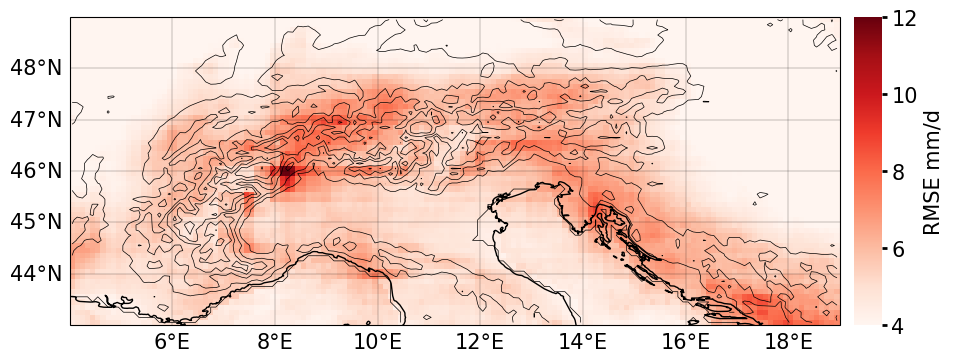

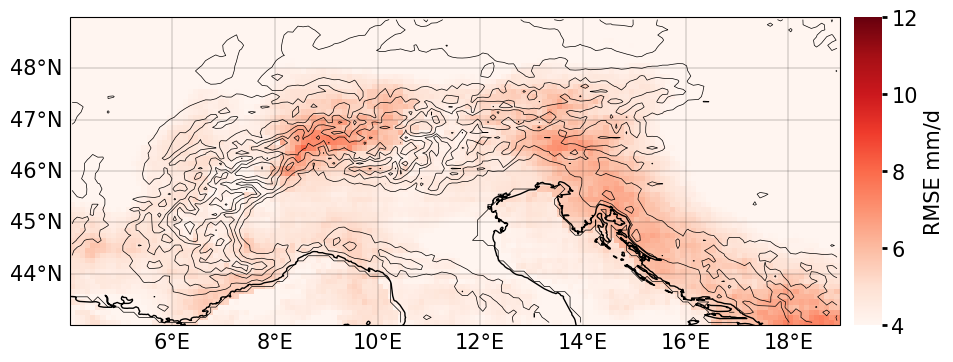

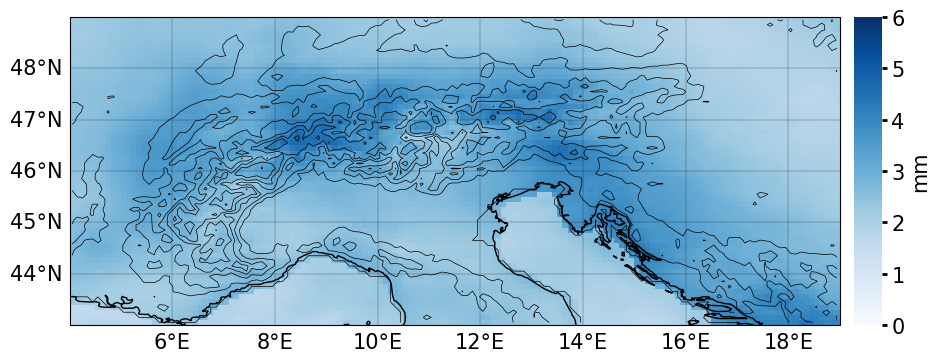

In [43]:
#RMSE MAP of ERA5 and IMERG
mask_t_q= (era5_Imerg['precipitationQualityIndex'] >= 0.6) #& (era5_Imerg['Train/Valid/Test indices'] == 'test')
A = era5_Imerg['Imerg_orgres'].where(mask_t_q, drop=True)
B = era5_Imerg['ppt_era5'].where(mask_t_q, drop=True)

squared_diff = (A - B) ** 2
mean_squared_diff = squared_diff.mean(dim='time')
rmse_map = np.sqrt(mean_squared_diff)
rmse = np.sqrt(np.nanmean((A.values.flatten() - B.values.flatten()) ** 2))
print(rmse)
# Plot RMSE map
fig1 = plt.figure(figsize=(14, 4), facecolor='none')
map_m_fig(fig1, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'', m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4, vmax=12)
#################################################################################################################################
A = era5_Imerg['Imerg_orgres'].where(mask_t_q, drop=True)
B = era5_Imerg['XGB'].where(mask_t_q, drop=True)

squared_diff = (A - B) ** 2
mean_squared_diff = squared_diff.mean(dim='time')
rmse_map = np.sqrt(mean_squared_diff)
rmse = np.sqrt(np.nanmean((A.values.flatten() - B.values.flatten()) ** 2))
print(rmse)
# Plot RMSE map
fig1 = plt.figure(figsize=(14, 4), facecolor='none')
map_m_fig(fig1, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'', m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4, vmax=12)
#################################################################################################################################
fig = plt.figure(figsize=(14, 4))
map_m_fig(fig, era5_Imerg["Imerg_orgres"].where((era5_Imerg['precipitationQualityIndex'] >= 0.6),drop=True).mean(dim='time').values, era5_elev, era5_long, era5_lat, title_fig=f'', m_unit=era5_Imerg["Imerg_orgres"].attrs.get('units', 'unitless'), chosen_map="Blues", vmin=0, vmax=6)



Processing season: fall

Processing season: winter

Processing season: spring

Processing season: summer

Displaying all figures...


C:\Users\Iman\AppData\Local\Temp\ipykernel_22892\338937248.py:54: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


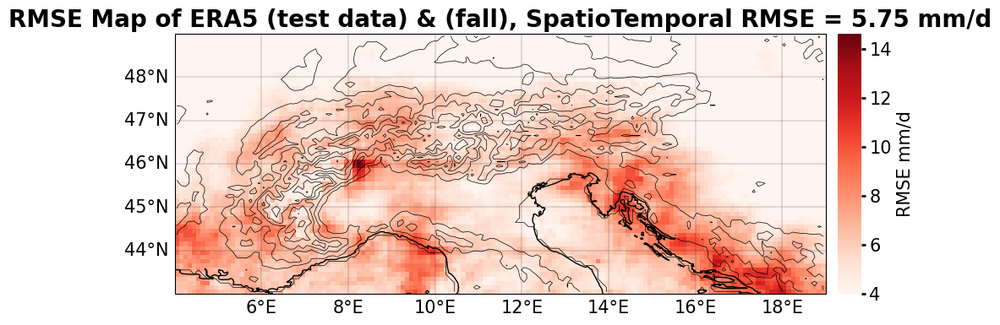

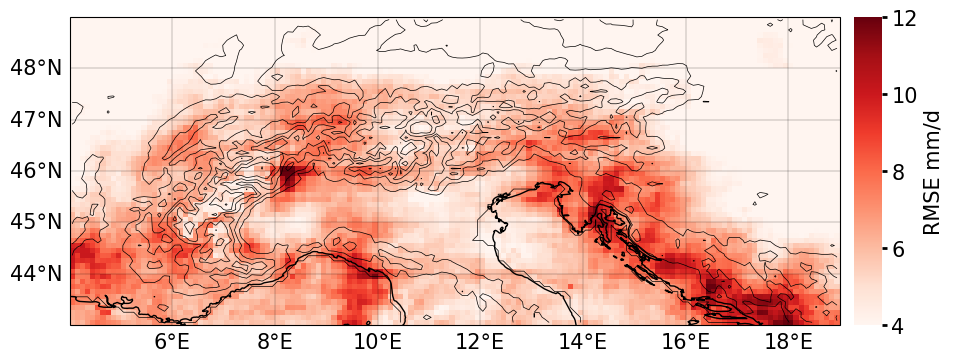

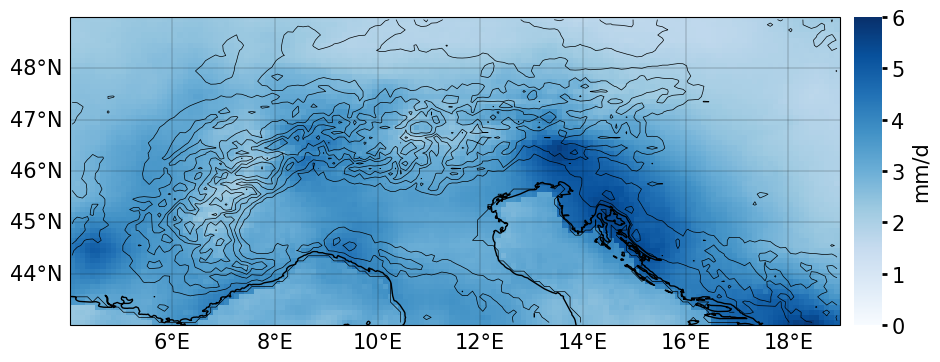

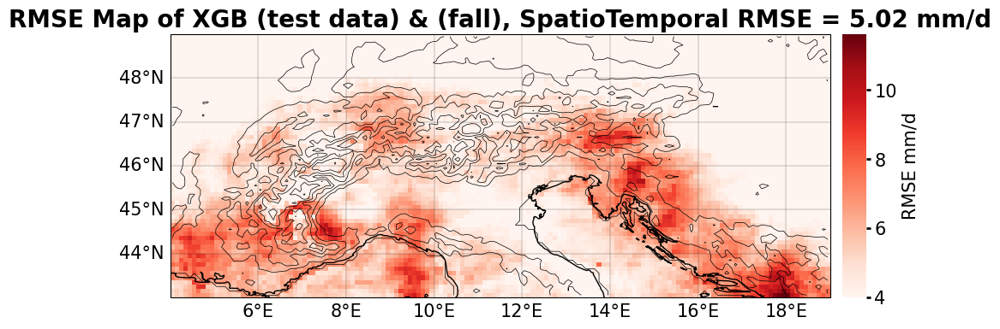

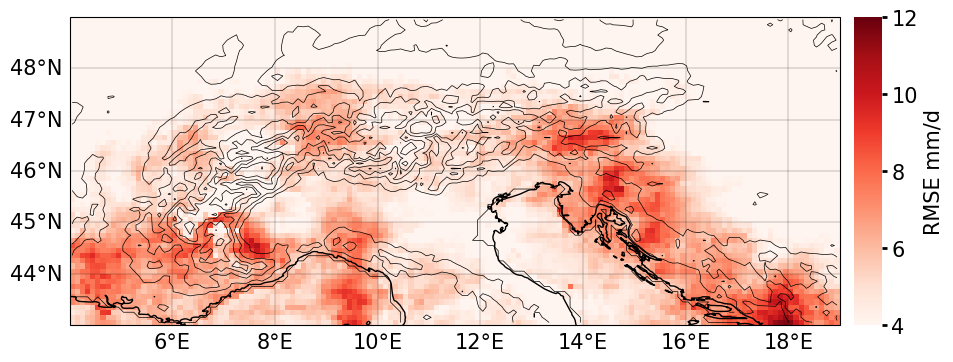

...

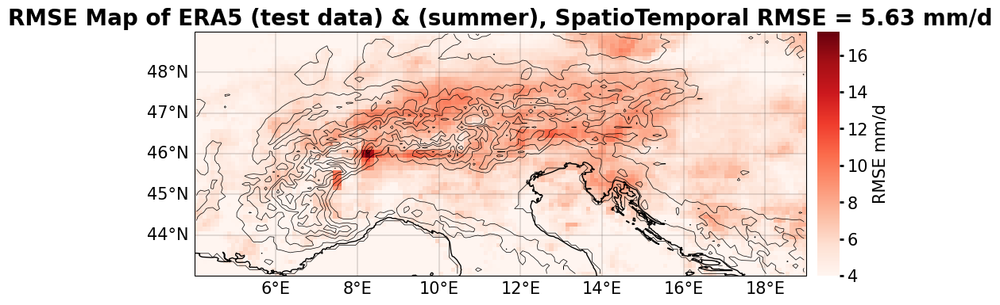

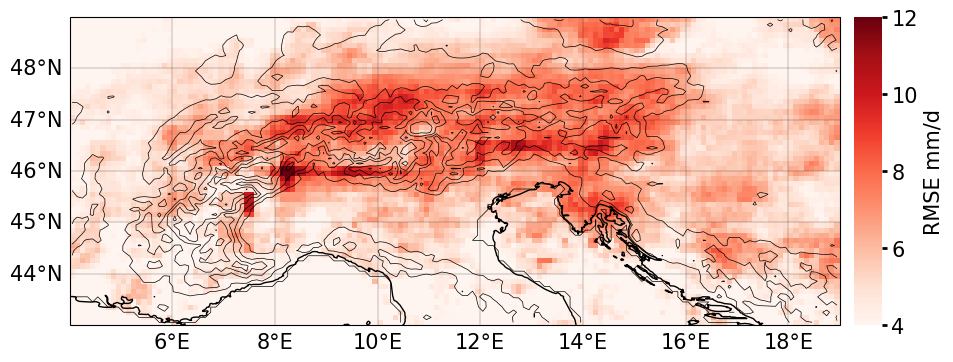

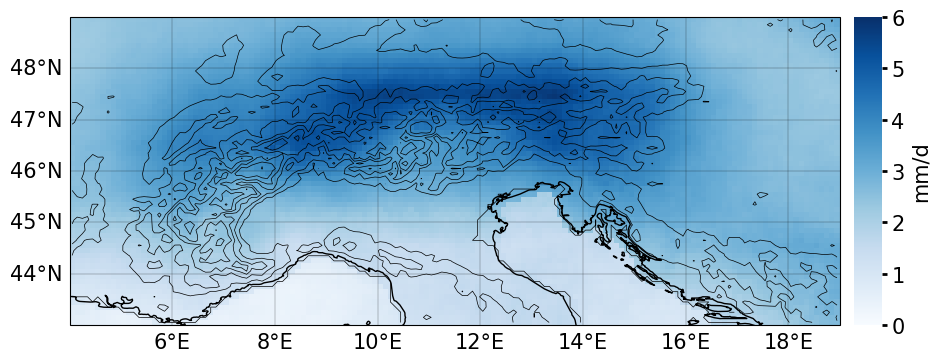

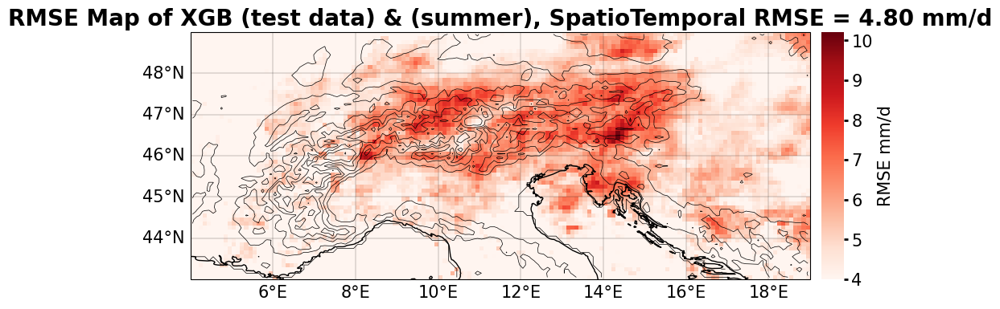

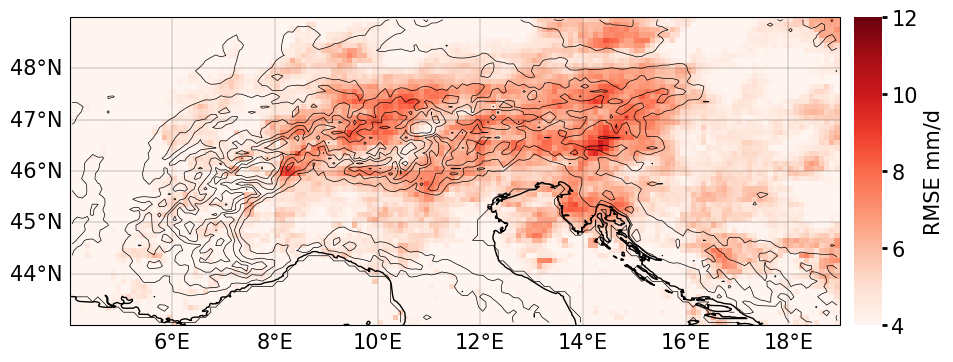

In [44]:
#seasonal ERA5 RMSE 

seasons = ['fall', 'winter', 'spring', 'summer']
figures = []  # Collect all figures here

for season in seasons:
    print(f"\nProcessing season: {season}")
    mask_s_t_q=  (era5_Imerg['Seasonal Mask'] == season) & (era5_Imerg['Train/Valid/Test indices'] == 'test') & (era5_Imerg['precipitationQualityIndex'] >= 0.6)
    A = era5_Imerg['Imerg_orgres'].where(mask_s_t_q,drop=True)
    B = era5_Imerg['ppt_era5'].where(mask_s_t_q,drop=True)
    C = era5_Imerg['XGB'].where(mask_s_t_q,drop=True)
    ################################################################################################################################
    ################################################################################################################################
    squared_diff = (A - B) ** 2
    mean_squared_diff = squared_diff.mean(dim='time')
    rmse_map = np.sqrt(mean_squared_diff)
    rmse = np.sqrt(np.nanmean((A.values.flatten() - B.values.flatten()) ** 2))

    # ########Plot RMSE map#################################### 
    fig1 = plt.figure(figsize=(14, 4), facecolor='none')
    map_m_fig(fig1, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'RMSE Map of ERA5 (test data) & ({season}), SpatioTemporal RMSE = {rmse:.2f} mm/d',
              m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4)
    figures.append(fig1)
    ######## Plot RMSE map without title########################
    fig2 = plt.figure(figsize=(14, 4), facecolor='none')
    map_m_fig(fig2, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'', m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4, vmax=12)
    figures.append(fig2)
    ######## Mean Precipitation####################################
    fig3 = plt.figure(figsize=(14, 4), facecolor='none')
    map_m_fig(fig3, era5_Imerg['Imerg_orgres'].where((era5_Imerg['Seasonal Mask'] == season)& (era5_Imerg['precipitationQualityIndex'] >= 0.6), drop=True).mean(dim='time'),
              era5_elev, era5_long, era5_lat,title_fig=f'', m_unit=r"mm/d", chosen_map="Blues", vmin=0 ,vmax=6)
    figures.append(fig3)
    ################################################################################################################################à
    ################################################################################################################################à
    squared_diff = (A - C) ** 2
    mean_squared_diff = squared_diff.mean(dim='time')
    rmse_map = np.sqrt(mean_squared_diff)
    rmse = np.sqrt(np.nanmean((A.values.flatten() - C.values.flatten()) ** 2))

    # ########Plot RMSE map#################################### 
    fig4 = plt.figure(figsize=(14, 4), facecolor='none')
    map_m_fig(fig4, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'RMSE Map of XGB (test data) & ({season}), SpatioTemporal RMSE = {rmse:.2f} mm/d',
              m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4)
    figures.append(fig4)
    ######## Plot RMSE map without title########################
    fig5 = plt.figure(figsize=(14, 4), facecolor='none')
    map_m_fig(fig5, rmse_map, era5_elev, era5_long, era5_lat,title_fig=f'', m_unit=r"RMSE mm/d", chosen_map="Reds", vmin=4, vmax=12)
    figures.append(fig5)


# After loop: show all collected figures
print("\nDisplaying all figures...")
for fig in figures:
    fig.show()


<h2>Error based on Z percentile</h2>

In [45]:
# 100 percent classification for Z

percentiles = range(100, 0, -1)
#percentiles = np.arange(100, 0, -0.5)

# Flatten the DataArray to get all z values across time, long, lat
z_values_flattened = era5_Imerg['ETOPO_consmap_z'].values.flatten()

# Initialize an empty DataArray for storing the percentile class
percentile_class = xr.full_like(era5_Imerg['ETOPO_consmap_z'], np.nan)

# Loop through each percentile and assign classes
for i in percentiles:
    percentile_value = np.percentile(z_values_flattened, i)
    # Use xarray's where method to assign the class where the condition is met
    percentile_class = percentile_class.where(era5_Imerg['ETOPO_consmap_z'] >= percentile_value, i) #if false, i

# Add the new DataArray as a variable in the original dataset 
era5_Imerg['Z 100 percentile class'] = percentile_class
era5_Imerg

<xarray.Dataset> Size: 3GB
Dimensions:                    (time: 7300, lon: 150, lat: 60)
Coordinates:
  * time                       (time) datetime64[ns] 58kB 2001-01-01T11:00:00...
  * lon                        (lon) float64 1kB 4.05 4.15 4.25 ... 18.85 18.95
  * lat                        (lat) float64 480B 43.05 43.15 ... 48.85 48.95
    custom_dayofyear           (time) int32 29kB 1 2 3 4 5 ... 362 363 364 365
Data variables:
    tciw                       (time, lat, lon) float32 263MB 0.003961 ... 0....
    tp_NearestN                (time, lat, lon) float32 263MB 0.1367 ... 0.05329
    camr                       (time, lat, lon) float32 263MB 0.001835 ... 0....
    ppt_era5                   (time, lat, lon) float32 263MB 0.1367 ... 0.05329
    ETOPO_consmap_z            (time, lat, lon) float32 263MB 0.0 0.0 ... 672.8
    Imerg_orgres               (time, lat, lon) float32 263MB 0.61 ... 0.035
    precipitationQualityIndex  (time, lat, lon) float32 263MB 0.6412 ... 0.7227
    Seasonal Mask              (time) object 58kB 'winter' 'winter' ... 'winter'
    Train/Valid/Test indices   (time, lat, lon) object 526MB 'test' ... 'train'
    XGB                        (time, lat, lon) float32 263MB 0.2473 ... 0.4109
    Z 100 percentile class     (time, lat, lon) float32 263MB 13.0 13.0 ... 71.0
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu Oct 03 16:44:23 2024: cdo remapnn,/mnt/c/Iman/Maxm/Imer...
    frequency:    day
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...

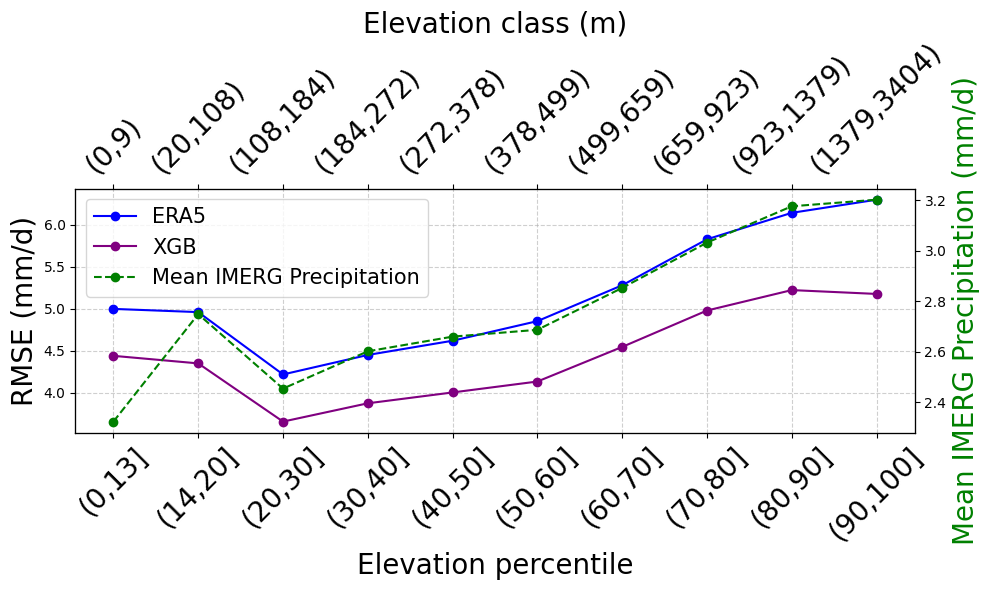

In [46]:
# Define percentile bins
percentile_bins = [(0, 13), (14, 20), (20, 30), (30, 40), (40, 50),
                   (50, 60), (60, 70), (70, 80), (80, 90), (90, 100)]

# Initialize list to collect results
results = []

for lower, upper in percentile_bins:
    mask = (
        (era5_Imerg['Z 100 percentile class'] > lower) &
        (era5_Imerg['Z 100 percentile class'] <= upper) &
        (era5_Imerg['precipitationQualityIndex'] >= 0.6) &
        (era5_Imerg['Train/Valid/Test indices'] == 'test')
    )

    A = era5_Imerg['Imerg_orgres'].where(mask).values.flatten()
    B = era5_Imerg['XGB'].where(mask).values.flatten()
    C = era5_Imerg['ppt_era5'].where(mask).values.flatten()

    rmse_xgb = np.sqrt(np.nanmean((A - B) ** 2))
    rmse_era5 = np.sqrt(np.nanmean((A - C) ** 2))
    mean_Imerg = np.nanmean(A)

    lower_elev = np.percentile(era5_Imerg['ETOPO_consmap_z'].values.flatten(), lower)
    upper_elev = np.percentile(era5_Imerg['ETOPO_consmap_z'].values.flatten(), upper)

    results.append({
        'lower_percentile': lower,
        'upper_percentile': upper,
        'lower_elev': lower_elev,
        'upper_elev': upper_elev,
        'rmse_xgb': rmse_xgb,
        'rmse_era5': rmse_era5,
        'mean_Imerg': mean_Imerg
    })

# Create DataFrame
df_zclass = pd.DataFrame(results)

# Plotting
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot RMSE
ax1.errorbar(range(len(df_zclass)), df_zclass['rmse_era5'], fmt='o-', color='blue', label='ERA5')
ax1.errorbar(range(len(df_zclass)), df_zclass['rmse_xgb'], fmt='o-', color='purple', label='XGB')
ax1.set_ylabel('RMSE (mm/d)', color='black', fontsize=20)
ax1.set_xticks(range(len(df_zclass)))
xticklabels = [f"({l},{u}]" for l, u in zip(df_zclass['lower_percentile'], df_zclass['upper_percentile'])]
elev_classes = [f"({int(l)},{int(u)})" for l, u in zip(df_zclass['lower_elev'], df_zclass['upper_elev'])]
ax1.set_xticklabels(xticklabels, rotation=45, fontsize=20)
ax1.set_xlabel('Elevation percentile', fontsize=20)
ax1.grid(True, which='both', linestyle='--', alpha=0.6)

# Secondary axis for mean IMERG precipitation
ax2 = ax1.twinx()
ax2.plot(range(len(df_zclass)), df_zclass['mean_Imerg'], 'g--o', label='Mean IMERG Precipitation')
ax2.set_ylabel('Mean IMERG Precipitation (mm/d)', color='green', fontsize=20)

# Legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=15)

# Elevation classes as secondary x-axis
ax3 = ax1.twiny()
ax3.set_xlim(ax1.get_xlim())
ax3.set_xticks(range(len(df_zclass)))
ax3.set_xticklabels(elev_classes, rotation=45, fontsize=20)
ax3.set_xlabel('Elevation class (m)', fontsize=20)

plt.tight_layout()
plt.show()


<h2>Error based on P percentile</h2>

In [47]:
# 100 percent classification for Z

percentiles = range(100, 0, -1)
#percentiles = np.arange(100.0, 0.0, -0.5)
#percentiles = np.arange(100.0, 0.0, -0.1)

# Flatten the DataArray to get all z values across time, long, lat
Imerg_orgres_values_flattened = era5_Imerg['Imerg_orgres'].values.flatten()

# Initialize an empty DataArray for storing the percentile class
percentile_class = xr.full_like(era5_Imerg['Imerg_orgres'], np.nan)

# Loop through each percentile and assign classes
for i in percentiles:
    percentile_value = np.percentile(Imerg_orgres_values_flattened, i)
    # Use xarray's where method to assign the class where the condition is met
    percentile_class = percentile_class.where(era5_Imerg['Imerg_orgres'] >= percentile_value, i) 

# Add the new DataArray as a variable in the original dataset 
era5_Imerg['Imerg_orgres 100 percentile class'] = percentile_class
era5_Imerg


<xarray.Dataset> Size: 3GB
Dimensions:                            (time: 7300, lon: 150, lat: 60)
Coordinates:
  * time                               (time) datetime64[ns] 58kB 2001-01-01T...
  * lon                                (lon) float64 1kB 4.05 4.15 ... 18.95
  * lat                                (lat) float64 480B 43.05 43.15 ... 48.95
    custom_dayofyear                   (time) int32 29kB 1 2 3 4 ... 363 364 365
Data variables:
    tciw                               (time, lat, lon) float32 263MB 0.00396...
    tp_NearestN                        (time, lat, lon) float32 263MB 0.1367 ...
    camr                               (time, lat, lon) float32 263MB 0.00183...
    ppt_era5                           (time, lat, lon) float32 263MB 0.1367 ...
    ETOPO_consmap_z                    (time, lat, lon) float32 263MB 0.0 ......
    Imerg_orgres                       (time, lat, lon) float32 263MB 0.61 .....
    precipitationQualityIndex          (time, lat, lon) float32 263MB 0.6412 ...
    Seasonal Mask                      (time) object 58kB 'winter' ... 'winter'
    Train/Valid/Test indices           (time, lat, lon) object 526MB 'test' ....
    XGB                                (time, lat, lon) float32 263MB 0.2473 ...
    Z 100 percentile class             (time, lat, lon) float32 263MB 13.0 .....
    Imerg_orgres 100 percentile class  (time, lat, lon) float32 263MB 62.0 .....
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu Oct 03 16:44:23 2024: cdo remapnn,/mnt/c/Iman/Maxm/Imer...
    frequency:    day
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...

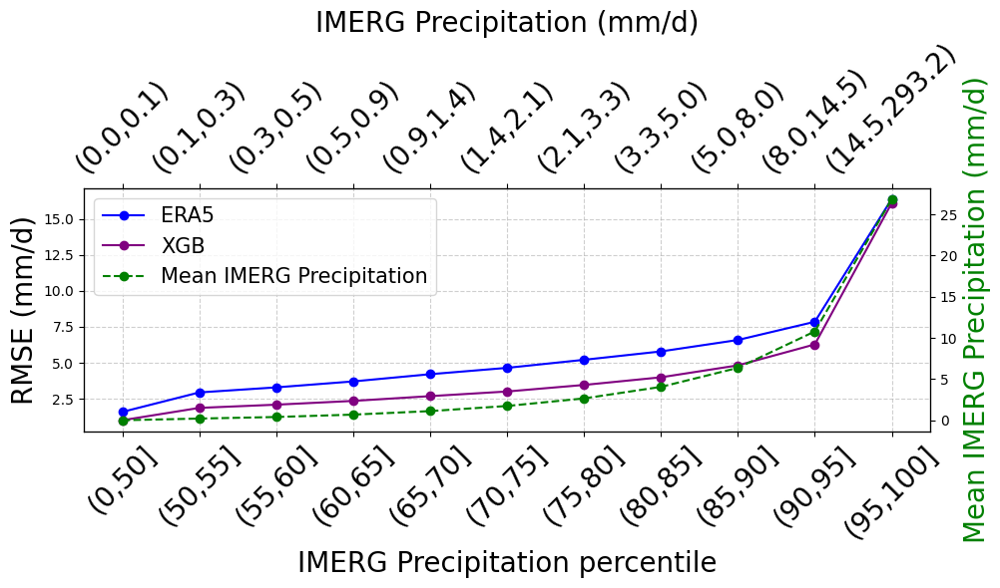

In [48]:
# Define percentile bins
percentile_bins = [(0, 50), (50, 55), (55, 60), (60, 65), (65, 70), (70, 75), (75, 80), (80, 85), (85, 90), (90, 95), (95, 100)]

# Initialize list to collect results
results = []

for lower, upper in percentile_bins:
    mask = (
        (era5_Imerg['Imerg_orgres 100 percentile class'] > lower) &
        (era5_Imerg['Imerg_orgres 100 percentile class'] <= upper) &
        (era5_Imerg['precipitationQualityIndex'] >= 0.6) &
        (era5_Imerg['Train/Valid/Test indices'] == 'test')
    )

    A = era5_Imerg['Imerg_orgres'].where(mask).values.flatten()
    B = era5_Imerg['XGB'].where(mask).values.flatten()
    C = era5_Imerg['ppt_era5'].where(mask).values.flatten()

    rmse_xgb = np.sqrt(np.nanmean((A - B) ** 2))
    rmse_era5 = np.sqrt(np.nanmean((A - C) ** 2))
    mean_Imerg = np.nanmean(A)

    lower_elev = np.percentile(era5_Imerg['Imerg_orgres'].values.flatten(), lower)
    upper_elev = np.percentile(era5_Imerg['Imerg_orgres'].values.flatten(), upper)

    results.append({
        'lower_percentile': lower,
        'upper_percentile': upper,
        'lower_elev': lower_elev,
        'upper_elev': upper_elev,
        'rmse_xgb': rmse_xgb,
        'rmse_era5': rmse_era5,
        'mean_Imerg': mean_Imerg
    })

# Create DataFrame
df_pclass = pd.DataFrame(results)

# Plotting
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot RMSE
ax1.errorbar(range(len(df_pclass)), df_pclass['rmse_era5'], fmt='o-', color='blue', label='ERA5')
ax1.errorbar(range(len(df_pclass)), df_pclass['rmse_xgb'], fmt='o-', color='purple', label='XGB')
ax1.set_ylabel('RMSE (mm/d)', color='black', fontsize=20)
ax1.set_xticks(range(len(df_pclass)))
xticklabels = [f"({l},{u}]" for l, u in zip(df_pclass['lower_percentile'], df_pclass['upper_percentile'])]
elev_classes = [f"({l:.1f},{u:.1f})" for l, u in zip(df_pclass['lower_elev'], df_pclass['upper_elev'])]
ax1.set_xticklabels(xticklabels, rotation=45, fontsize=20)
ax1.set_xlabel('IMERG Precipitation percentile', fontsize=20)
ax1.grid(True, which='both', linestyle='--', alpha=0.6)

# Secondary axis for mean IMERG precipitation
ax2 = ax1.twinx()
ax2.plot(range(len(df_pclass)), df_pclass['mean_Imerg'], 'g--o', label='Mean IMERG Precipitation')
ax2.set_ylabel('Mean IMERG Precipitation (mm/d)', color='green', fontsize=20)

# Legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left', fontsize=15)

# Elevation classes as secondary x-axis
ax3 = ax1.twiny()
ax3.set_xlim(ax1.get_xlim())
ax3.set_xticks(range(len(df_pclass)))
ax3.set_xticklabels(elev_classes, rotation=45, fontsize=20)
ax3.set_xlabel('IMERG Precipitation (mm/d)', fontsize=20)

plt.tight_layout()
plt.show()


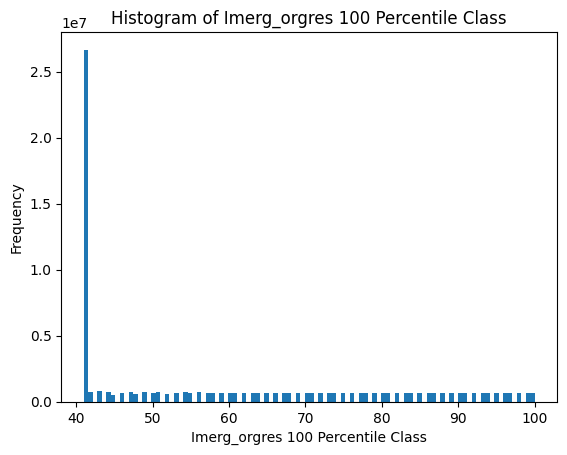

In [49]:
plt.hist(era5_Imerg['Imerg_orgres 100 percentile class'].values.flatten(), bins=100)
# Add labels and title
plt.xlabel('Imerg_orgres 100 Percentile Class')
plt.ylabel('Frequency')
plt.title('Histogram of Imerg_orgres 100 Percentile Class')

# Show the plot
plt.show()

## 5️⃣ Validation

<h1>HISTALP</h1>

In [50]:
loc_list = [
    "AT_BMU", "AT_FRE", "AT_KOL", "AT_LAD", "AT_SPO", "AT_WIE",
    "BA_JAJ", "DE_KMF", "DE_LHU", "DE_ULM", "HR_POZ", "HR_ZAD", "HU_PAP",
    "IT_BAR", "IT_FOR", "IT_IMP", "IT_MIL", "IT_UDI", "IT_VAL", "SI_LJU", 
    "AT_ADM", "SI_CEL", "IT_ROV", "IT_BRX", "DE_OBS","IT_TOM",
    "IT_BOZ", "HU_SZO", "HR_KVA", "DE_STU", "DE_ROS","IT_PAR",
    "BA_BIH", "AT_WAI", "AT_TAM", "AT_SSB", "AT_KAL","IT_VEN",
    "AT_SAL", "AT_RAU", "AT_OFK", "AT_LAG", "AT_KRE", "AT_KOR", 
    "AT_BST", "AT_BRE", "AT_FLA", "AT_INN", "AT_VIL", "AT_RET",    
    ]

In [51]:
all_dfs = []

for loc in loc_list: 
    # Define the data directory
    data_dir = f"{path}/HISTALP_stations/HISTALP_{loc}_R01_1760_2025.csv"

    # Read raw data to extract metadata
    with open(data_dir, "r") as f:
        raw_lines = f.readlines()

    # Extract metadata from comment lines
    metadata = {}
    data_start_idx = 0  # Default index to locate actual data start

    for i, line in enumerate(raw_lines):
        if line.startswith("#"):
            key_value = line.replace("#", "").strip().split(": ", 1)  # Ensure only 1 split
            if len(key_value) == 2:
                metadata[key_value[0].strip()] = key_value[1].strip()
        else:
            data_start_idx = i  # Identify where actual data starts
            break

    # Read CSV with proper delimiter (;)
    df = pd.read_csv(data_dir, delimiter=";", skiprows=data_start_idx)

    # Rename the first column as 'Year'
    df.rename(columns={df.columns[0]: "Year"}, inplace=True)

    # Convert 'Year' to integer and replace missing values
    df["Year"] = df["Year"].astype(int)
    df.replace(999999, float("nan"), inplace=True)

    # Add longitude from metadata (handle missing key safely)
    df["longitude"] = float(metadata.get("longitude", "nan"))  # Default to NaN if missing
    df["latitude"] = float(metadata.get("latitude", "nan"))
    df["height"] = float(metadata.get("height", "nan"))
    df["station"] = str(metadata.get("station", "nan"))

    columns_to_remove = ["mar-may", "jun-aug", "sep-nov", "dec-feb", "apr-sep", "oct-mar", "jan-dec"]
    df.drop(columns=columns_to_remove, inplace=True, errors='ignore')  # 'errors="ignore"' prevents errors if columns don't exist

    # Filter rows where 'Year' is between 1960 and 2014
    df = df[(df["Year"] >= 1960) & (df["Year"] <= 2020)] 
    
    all_dfs.append(df)

# Concatenate all DataFrames into one
Histalp_stations_df = pd.concat(all_dfs, ignore_index=True)
#print(Histalp_stations_df.isnull().sum())
Histalp_stations_df

,Year,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec,longitude,latitude,height,station
0,1960,18.0,17.0,43.0,16.0,48.0,95.0,145.0,135.0,118.0,83.0,46.0,86.0,15.25,47.405,482.0,Bruck/Mur
1,1961,12.0,48.0,8.0,38.0,83.0,51.0,94.0,91.0,13.0,146.0,85.0,53.0,15.25,47.405,482.0,Bruck/Mur
2,1962,33.0,49.0,29.0,16.0,106.0,116.0,92.0,72.0,48.0,73.0,82.0,37.0,15.25,47.405,482.0,Bruck/Mur
3,1963,29.0,28.0,62.0,50.0,98.0,134.0,93.0,162.0,37.0,11.0,76.0,30.0,15.25,47.405,482.0,Bruck/Mur
4,1964,0.0,14.0,60.0,42.0,65.0,96.0,56.0,79.0,50.0,176.0,51.0,54.0,15.25,47.405,482.0,Bruck/Mur
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2016,18.0,51.0,10.0,41.0,59.0,94.0,110.0,53.0,8.0,52.0,25.0,14.0,15.95,48.754,256.0,Retz
3046,2017,13.0,12.0,20.0,46.0,25.0,12.0,53.0,40.0,69.0,34.0,34.0,15.0,15.95,48.754,256.0,Retz
3047,2018,25.0,20.0,21.0,9.0,72.0,48.0,28.0,40.0,78.0,11.0,23.0,32.0,15.95,48.754,256.0,Retz
3048,2019,14.0,8.0,20.0,18.0,127.0,29.0,99.0,104.0,52.0,37.0,25.0,39.0,15.95,48.754,256.0,Retz


for Mean of 20 stations

In [52]:
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km
################################################################################
def find_closest_point(Imerg, station_latitude, station_longitude):
    closest_lat, closest_lon = None, None
    min_distance = float("inf")  # Start with a very large distance

    for lat in Imerg['lat']:  # Loop through all latitudes
        for lon in Imerg['lon']:  # Loop through all longitudes
            distance = calculate_distance(lat, lon, station_latitude, station_longitude)

            if distance < min_distance:
                min_distance = distance
                closest_lat, closest_lon = lat, lon

    return float(closest_lat), float(closest_lon)  # Return the closest point found

In [53]:
#closest Grid point of era5_Imerg based on stations' positions
df_lon_lat= Histalp_stations_df[['latitude', 'longitude']].drop_duplicates()

# Loop through each row 
closest_latitudes = []
closest_longitudes = []

for index, row in tqdm(df_lon_lat.iterrows()):
    closest_lat, closest_lon = find_closest_point(era5_Imerg, row['latitude'], row['longitude'])
    closest_latitudes.append(closest_lat)
    closest_longitudes.append(closest_lon)

# Add the new columns to the DataFrame
df_lon_lat['closest_Imerg_lat'] = closest_latitudes
df_lon_lat['closest_Imerg_lon'] = closest_longitudes
#####################################################################################################
# Merge Histalp_stations_df with df_lon_lat on latitude and longitude
Histalp_stations_df = Histalp_stations_df.merge(
    df_lon_lat[['latitude', 'longitude', 'closest_Imerg_lat', 'closest_Imerg_lon']],
    on=['latitude', 'longitude'], 
    how='left'  # Use 'left' to keep all Histalp_stations_df rows
)
#####################################################################################################
#round the long and lat to be sure
Histalp_stations_df['closest_Imerg_lat'] = Histalp_stations_df['closest_Imerg_lat'].round(6)
Histalp_stations_df['closest_Imerg_lon'] = Histalp_stations_df['closest_Imerg_lon'].round(6)

#Histalp_stations_df['closest_Imerg_lat'] = Histalp_stations_df['closest_Imerg_lat'].apply(lambda x: float(format(x, '.6f')))
#Histalp_stations_df['closest_Imerg_lon'] = Histalp_stations_df['closest_Imerg_lon'].apply(lambda x: float(format(x, '.6f')))

Histalp_stations_df

50it [03:32,  4.25s/it]


,Year,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec,longitude,latitude,height,station,closest_Imerg_lat,closest_Imerg_lon
0,1960,18.0,17.0,43.0,16.0,48.0,95.0,145.0,135.0,118.0,83.0,46.0,86.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25
1,1961,12.0,48.0,8.0,38.0,83.0,51.0,94.0,91.0,13.0,146.0,85.0,53.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25
2,1962,33.0,49.0,29.0,16.0,106.0,116.0,92.0,72.0,48.0,73.0,82.0,37.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25
3,1963,29.0,28.0,62.0,50.0,98.0,134.0,93.0,162.0,37.0,11.0,76.0,30.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25
4,1964,0.0,14.0,60.0,42.0,65.0,96.0,56.0,79.0,50.0,176.0,51.0,54.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2016,18.0,51.0,10.0,41.0,59.0,94.0,110.0,53.0,8.0,52.0,25.0,14.0,15.95,48.754,256.0,Retz,48.75,15.95
3046,2017,13.0,12.0,20.0,46.0,25.0,12.0,53.0,40.0,69.0,34.0,34.0,15.0,15.95,48.754,256.0,Retz,48.75,15.95
3047,2018,25.0,20.0,21.0,9.0,72.0,48.0,28.0,40.0,78.0,11.0,23.0,32.0,15.95,48.754,256.0,Retz,48.75,15.95
3048,2019,14.0,8.0,20.0,18.0,127.0,29.0,99.0,104.0,52.0,37.0,25.0,39.0,15.95,48.754,256.0,Retz,48.75,15.95


In [54]:
Histalp_stations_df_overallstations=Histalp_stations_df.drop(columns= ['longitude', 'latitude', 'station','closest_Imerg_lat','closest_Imerg_lon','height']).groupby('Year').mean()
Histalp_stations_df_overallstations = Histalp_stations_df_overallstations.reset_index()
# Convert wide format (monthly columns) to long format
Histalp_df_long = Histalp_stations_df_overallstations.melt(id_vars=["Year"],var_name="Month", value_name="Value")
# Map month names to numeric values for proper datetime conversion
month_map = {'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
             'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12}

Histalp_df_long["Month"] = Histalp_df_long["Month"].map(month_map)

# Create a datetime column
Histalp_df_long["Date"] = pd.to_datetime(Histalp_df_long[["Year", "Month"]].assign(day=1))

# Sort the DataFrame for proper plotting
Histalp_df_long = Histalp_df_long.sort_values(["Date"])
Histalp_df_long

,Year,Month,Value,Date
0,1960,1,55.700000,1960-01-01
61,1960,2,67.820000,1960-02-01
122,1960,3,80.040000,1960-03-01
183,1960,4,48.840000,1960-04-01
244,1960,5,62.760000,1960-05-01
...,...,...,...,...
487,2020,8,187.904762,2020-08-01
548,2020,9,108.619048,2020-09-01
609,2020,10,110.476190,2020-10-01
670,2020,11,16.190476,2020-11-01


In [55]:

era5_Imerg['lat'] = era5_Imerg['lat'].round(2).astype(float)
era5_Imerg['lon'] = era5_Imerg['lon'].round(2).astype(float)
era5_backintime['lat'] = era5_backintime['lat'].round(2).astype(float)
era5_backintime['lon'] = era5_backintime['lon'].round(2).astype(float)


era5_Imerg_filt_month= era5_Imerg.resample(time="1MS").sum()
era5_backintime_filt_month=era5_backintime.resample(time="1MS").sum()
era5_backintime_filt_month

<xarray.Dataset> Size: 89MB
Dimensions:          (time: 492, lat: 60, lon: 150)
Coordinates:
  * lon              (lon) float64 1kB 4.05 4.15 4.25 4.35 ... 18.75 18.85 18.95
  * lat              (lat) float64 480B 43.05 43.15 43.25 ... 48.75 48.85 48.95
  * time             (time) datetime64[ns] 4kB 1960-01-01 ... 2000-12-01
Data variables:
    camr             (time, lat, lon) float32 18MB 0.03703 0.03697 ... 0.03025
    tciw             (time, lat, lon) float32 18MB 0.749 0.7943 ... 0.9025
    ppt_era5         (time, lat, lon) float32 18MB 36.77 41.06 ... 69.25 71.39
    ETOPO_consmap_z  (time, lat, lon) float32 18MB 0.0 0.0 ... 2.086e+04
    XGB              (time, lat, lon) float32 18MB 40.93 44.96 ... 55.67 54.8
Attributes:
    CDI:                     Climate Data Interface version 2.0.4 (https://mp...
    Conventions:             CF-1.7
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Tue Jan 28 09:58:22 2025: cdo remapnn,/mnt/c/Ima...
    frequency:               day
    CDO:                     Climate Data Operators version 2.0.4 (https://mp...

In [56]:
lat_points = xr.DataArray(Histalp_stations_df[['closest_Imerg_lat', 'closest_Imerg_lon']].drop_duplicates()['closest_Imerg_lat'].values, dims="points")
lon_points = xr.DataArray(Histalp_stations_df[['closest_Imerg_lat', 'closest_Imerg_lon']].drop_duplicates()['closest_Imerg_lon'].values, dims="points")

# Select only matching lat/lon pairs
era5_backintime_filt_month_stations = era5_backintime_filt_month.sel(lat=lat_points, lon=lon_points, method=None) # No nearest
era5_Imerg_filt_month_stations = era5_Imerg_filt_month.sel(lat=lat_points, lon=lon_points, method=None)  # No nearest

era5_Imerg_filt_month_stations


<xarray.Dataset> Size: 483kB
Dimensions:                            (time: 240, points: 50)
Coordinates:
    lon                                (points) float64 400B 15.25 ... 15.95
    lat                                (points) float64 400B 47.45 ... 48.75
  * time                               (time) datetime64[ns] 2kB 2001-01-01 ....
Dimensions without coordinates: points
Data variables:
    tciw                               (time, points) float32 48kB 1.049 ... ...
    tp_NearestN                        (time, points) float32 48kB 56.9 ... 4...
    camr                               (time, points) float32 48kB 0.02471 .....
    ppt_era5                           (time, points) float32 48kB 56.9 ... 4...
    ETOPO_consmap_z                    (time, points) float32 48kB 2.35e+04 ....
    Imerg_orgres                       (time, points) float32 48kB 61.75 ... ...
    precipitationQualityIndex          (time, points) float32 48kB 14.67 ... ...
    XGB                                (time, points) float32 48kB 47.79 ... ...
    Z 100 percentile class             (time, points) float32 48kB 2.325e+03 ...
    Imerg_orgres 100 percentile class  (time, points) float32 48kB 2.088e+03 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu Oct 03 16:44:23 2024: cdo remapnn,/mnt/c/Iman/Maxm/Imer...
    frequency:    day
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...

RMSE

In [57]:
#Select Time
time_start='1960-01-01'  
time_end = '2000-12-31'   
######################
A= Histalp_df_long["Value"][(Histalp_df_long["Date"] >= time_start ) & (Histalp_df_long["Date"] < time_end)].values
A_df = Histalp_df_long[(Histalp_df_long["Date"] >= time_start) & (Histalp_df_long["Date"] < time_end)][['Date', 'Value']].rename(columns={'Value': 'A'})
B_df = era5_backintime_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='B').reset_index()
merged = pd.merge(A_df, B_df, left_on='Date', right_on='time', how='inner')
# Step 4: Compute RMSE
rmse_his_era5_1960_2000 = np.sqrt(np.nanmean((merged['A'] - merged['B']) ** 2))
r2_his_era5_1960_2000 = r2_score(merged['A'], merged['B'])
print('rmse_his_era5_1960_2000: ', rmse_his_era5_1960_2000)
print('r2_his_era5_1960_2000: ', r2_his_era5_1960_2000)
#####################################################################àà
A_df = Histalp_df_long[(Histalp_df_long["Date"] >= time_start) & (Histalp_df_long["Date"] < time_end)][['Date', 'Value']].rename(columns={'Value': 'A'})
B_df = era5_backintime_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='B').reset_index()
merged = pd.merge(A_df, B_df, left_on='Date', right_on='time', how='inner')
# Step 4: Compute RMSE
rmse_his_xgb_1960_2000 = np.sqrt(np.nanmean((merged['A'] - merged['B']) ** 2))
r2_his_xgb_1960_2000 = r2_score(merged['A'], merged['B'])
print('rmse_his_xgb_1960_2000: ', rmse_his_xgb_1960_2000)
print('r2_his_xgb_1960_2000: ', r2_his_xgb_1960_2000)
####################################################################################################################################
#Select Time
time_start='2001-01-01'  
time_end = '2020-12-31'  
######################
A= Histalp_df_long["Value"][(Histalp_df_long["Date"] >= time_start ) & (Histalp_df_long["Date"] < time_end)].values
A_df = Histalp_df_long[(Histalp_df_long["Date"] >= time_start) & (Histalp_df_long["Date"] < time_end)][['Date', 'Value']].rename(columns={'Value': 'A'})
B_df = era5_Imerg_filt_month_stations['Imerg_orgres'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='B').reset_index()
merged = pd.merge(A_df, B_df, left_on='Date', right_on='time', how='inner')
# Step 4: Compute RMSE
rmse_his_Imerg_2001_2020 = np.sqrt(np.nanmean((merged['A'] - merged['B']) ** 2))
r2_his_Imerg_2001_2020 = r2_score(merged['A'], merged['B'])
print('rmse_his_Imerg_2001_2020: ', rmse_his_Imerg_2001_2020)
print('r2_his_Imerg_2001_2020: ', r2_his_Imerg_2001_2020) 
##################################à
B_df = era5_Imerg_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='B').reset_index()
merged = pd.merge(A_df, B_df, left_on='Date', right_on='time', how='inner')
# Step 4: Compute RMSE
rmse_his_era5_2001_2020 = np.sqrt(np.nanmean((merged['A'] - merged['B']) ** 2))
r2_his_era5_2001_2020 = r2_score(merged['A'], merged['B'])
print('rmse_his_era5_2001_2020: ', rmse_his_era5_2001_2020)
print('r2_his_era5_2001_2020: ', r2_his_era5_2001_2020) 

######################
B_df = era5_Imerg_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='B').reset_index()
merged = pd.merge(A_df, B_df, left_on='Date', right_on='time', how='inner')
# Step 4: Compute RMSE
rmse_his_xgb_2001_2020 = np.sqrt(np.nanmean((merged['A'] - merged['B']) ** 2))
r2_his_xgb_2001_2020 = r2_score(merged['A'], merged['B'])
print('rmse_his_xgb_2001_2020: ', rmse_his_xgb_2001_2020)
print('r2_his_xgb_2001_2020: ', r2_his_xgb_2001_2020) 
print('######################')
####################################################################################################################################
#Select Time
time_start='2001-01-01'  
time_end = '2020-12-31'   
######################
A= era5_Imerg_filt_month_stations['Imerg_orgres'].sel(time=slice(time_start , time_end)).mean(dim='points').values
B= era5_Imerg_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim='points').values
rmse_Imerg_era5_2001_2020 = np.sqrt(np.nanmean((A - B) ** 2))
r2_Imerg_era5_2001_2020 = r2_score(A, B)
print('rmse_Imerg_era5_2001_2020:', rmse_Imerg_era5_2001_2020)
print('r2_Imerg_era5_2001_2020: ', r2_Imerg_era5_2001_2020)
######################
C= era5_Imerg_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim='points').values
rmse_Imerg_xgb_2001_2020 = np.sqrt(np.nanmean((A - C) ** 2))
r2_Imerg_xgb_2001_2020 = r2_score(A, C)
print('rmse_Imerg_xgb_2001_2020: ', rmse_Imerg_xgb_2001_2020)
print('r2_Imerg_xgb_2001_2020:', r2_Imerg_xgb_2001_2020)



rmse_his_era5_1960_2000:  24.275770964395907
r2_his_era5_1960_2000:  0.4312575330219022
rmse_his_xgb_1960_2000:  11.576650004530048
r2_his_xgb_1960_2000:  0.8706592420224717
rmse_his_Imerg_2001_2020:  14.970956587395579
r2_his_Imerg_2001_2020:  0.8177061438201121
rmse_his_era5_2001_2020:  26.099822783547907
r2_his_era5_2001_2020:  0.44595116379607147
rmse_his_xgb_2001_2020:  14.549003475436303
r2_his_xgb_2001_2020:  0.8278371572194081
######################
rmse_Imerg_era5_2001_2020: 17.768024
r2_Imerg_era5_2001_2020:  0.7466691732406616
rmse_Imerg_xgb_2001_2020:  13.318814
r2_Imerg_xgb_2001_2020: 0.85765540599823


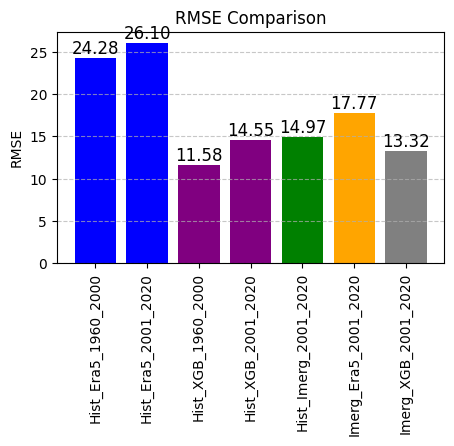

In [58]:
# Given RMSE values (replace with actual numbers)
rmse_values = [ rmse_his_era5_1960_2000,rmse_his_era5_2001_2020, rmse_his_xgb_1960_2000,rmse_his_xgb_2001_2020,rmse_his_Imerg_2001_2020,rmse_Imerg_era5_2001_2020,rmse_Imerg_xgb_2001_2020]
labels = [ 'Hist_Era5_1960_2000','Hist_Era5_2001_2020','Hist_XGB_1960_2000', 'Hist_XGB_2001_2020','Hist_Imerg_2001_2020','Imerg_Era5_2001_2020','Imerg_XGB_2001_2020' ]

# Create the plot
plt.figure(figsize=(5, 3))
plt.bar(labels, rmse_values, color=[ 'blue','blue', 'purple', 'purple','green','orange','grey'])
plt.ylabel('RMSE')
plt.title('RMSE Comparison')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels above bars
for i, value in enumerate(rmse_values):
    plt.text(i, value + 0.02 * max(rmse_values), f'{value:.2f}', ha='center', fontsize=12)

plt.xticks(rotation=90)
# Show the plot
plt.show()

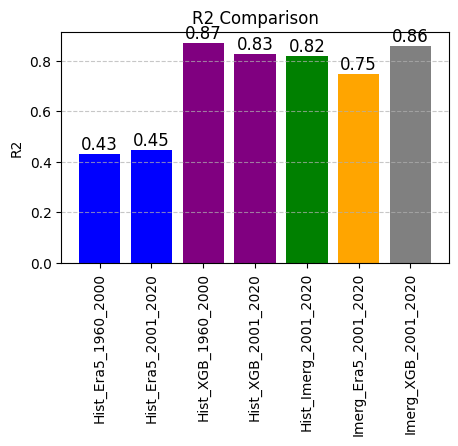

In [59]:
# Given RMSE values (replace with actual numbers)
r2_values = [ r2_his_era5_1960_2000,r2_his_era5_2001_2020, r2_his_xgb_1960_2000,r2_his_xgb_2001_2020,r2_his_Imerg_2001_2020,r2_Imerg_era5_2001_2020,r2_Imerg_xgb_2001_2020]
labels = [ 'Hist_Era5_1960_2000','Hist_Era5_2001_2020','Hist_XGB_1960_2000', 'Hist_XGB_2001_2020','Hist_Imerg_2001_2020','Imerg_Era5_2001_2020','Imerg_XGB_2001_2020' ]

# Create the plot
plt.figure(figsize=(5, 3))
plt.bar(labels, r2_values, color=[ 'blue','blue', 'purple', 'purple','green','orange','grey'])
plt.ylabel('R2')
plt.title('R2 Comparison')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels above bars
for i, value in enumerate(r2_values):
    plt.text(i, value + 0.02 * max(r2_values), f'{value:.2f}', ha='center', fontsize=12)

plt.xticks(rotation=90)
# Show the plot
plt.show()

Training On the HISTALP monthly Data

In [60]:
#for the HISTALP (instead of IMERG) training

era5_Imerg['lat'] = era5_Imerg['lat'].round(2).astype(float)
era5_Imerg['lon'] = era5_Imerg['lon'].round(2).astype(float)
era5_backintime['lat'] = era5_backintime['lat'].round(2).astype(float)
era5_backintime['lon'] = era5_backintime['lon'].round(2).astype(float)
########################################################
# Keep only specified variables
internal1 = era5_backintime[['camr', 'tciw', 'ppt_era5']]
internal2 = era5_Imerg[['camr', 'tciw', 'ppt_era5']]
# Merge the datasets
era5_Imerg_totime = xr.merge([internal1, internal2])
#######################################################
# Sum for ppt_era5 over each month
tp_monthly_sum = era5_Imerg_totime['ppt_era5'].resample(time='1MS').sum()
# Mean for camr and tciw over each month
camr_monthly_mean = era5_Imerg_totime[['camr']].resample(time='1MS').max()
tciw_monthly_mean = era5_Imerg_totime[['tciw']].resample(time='1MS').mean()
# Merge the monthly-aggregated datasets
era5_totime_monthly = xr.merge([tp_monthly_sum, camr_monthly_mean, tciw_monthly_mean])

era5_totime_monthly


<xarray.Dataset> Size: 79MB
Dimensions:   (lon: 150, lat: 60, time: 732)
Coordinates:
  * lon       (lon) float64 1kB 4.05 4.15 4.25 4.35 ... 18.65 18.75 18.85 18.95
  * lat       (lat) float64 480B 43.05 43.15 43.25 43.35 ... 48.75 48.85 48.95
  * time      (time) datetime64[ns] 6kB 1960-01-01 1960-02-01 ... 2020-12-01
Data variables:
    ppt_era5  (time, lat, lon) float32 26MB 36.77 41.06 42.5 ... 62.89 66.94
    camr      (time, lat, lon) float32 26MB 0.002244 0.002248 ... 0.001905
    tciw      (time, lat, lon) float32 26MB 0.02416 0.02562 ... 0.02049 0.02105
Attributes:
    units:    mm

In [61]:
lat_points = xr.DataArray(Histalp_stations_df[['closest_Imerg_lat', 'closest_Imerg_lon']].drop_duplicates()['closest_Imerg_lat'].values, dims="points")
lon_points = xr.DataArray(Histalp_stations_df[['closest_Imerg_lat', 'closest_Imerg_lon']].drop_duplicates()['closest_Imerg_lon'].values, dims="points")

# Select only matching lat/lon pairs
era5_totime_monthly_stations = era5_totime_monthly.sel(lat=lat_points, lon=lon_points, method=None) # No nearest
era5_totime_monthly_stations


<xarray.Dataset> Size: 446kB
Dimensions:   (points: 50, time: 732)
Coordinates:
    lon       (points) float64 400B 15.25 14.55 13.85 ... 11.35 13.85 15.95
    lat       (points) float64 400B 47.45 48.45 48.65 ... 47.25 46.65 48.75
  * time      (time) datetime64[ns] 6kB 1960-01-01 1960-02-01 ... 2020-12-01
Dimensions without coordinates: points
Data variables:
    ppt_era5  (time, points) float32 146kB 65.92 63.96 68.69 ... 250.0 45.77
    camr      (time, points) float32 146kB 0.001191 0.001335 ... 0.00219
    tciw      (time, points) float32 146kB 0.03057 0.03453 ... 0.05927 0.03351
Attributes:
    units:    mm

In [62]:
# Step 1: Convert Histalp to long format
df = Histalp_stations_df.copy()

# Create a 'month' and 'value' column
df_long = df.melt(
    id_vars=['Year', 'closest_Imerg_lat', 'closest_Imerg_lon'],
    value_vars=['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'],
    var_name='month',
    value_name='precip'
)

df_long

,Year,closest_Imerg_lat,closest_Imerg_lon,month,precip
0,1960,47.45,15.25,jan,18.0
1,1961,47.45,15.25,jan,12.0
2,1962,47.45,15.25,jan,33.0
3,1963,47.45,15.25,jan,29.0
4,1964,47.45,15.25,jan,0.0
...,...,...,...,...,...
36595,2016,48.75,15.95,dec,14.0
36596,2017,48.75,15.95,dec,15.0
36597,2018,48.75,15.95,dec,32.0
36598,2019,48.75,15.95,dec,39.0


In [63]:
# Month mapping to integer
month_map = {'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
             'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12}
df_long['month'] = df_long['month'].map(month_map)
df_long

,Year,closest_Imerg_lat,closest_Imerg_lon,month,precip
0,1960,47.45,15.25,1,18.0
1,1961,47.45,15.25,1,12.0
2,1962,47.45,15.25,1,33.0
3,1963,47.45,15.25,1,29.0
4,1964,47.45,15.25,1,0.0
...,...,...,...,...,...
36595,2016,48.75,15.95,12,14.0
36596,2017,48.75,15.95,12,15.0
36597,2018,48.75,15.95,12,32.0
36598,2019,48.75,15.95,12,39.0


In [64]:
# Create datetime
df_long['time'] = pd.to_datetime(dict(year=df_long['Year'], month=df_long['month'], day=1))
df_long

,Year,closest_Imerg_lat,closest_Imerg_lon,month,precip,time
0,1960,47.45,15.25,1,18.0,1960-01-01
1,1961,47.45,15.25,1,12.0,1961-01-01
2,1962,47.45,15.25,1,33.0,1962-01-01
3,1963,47.45,15.25,1,29.0,1963-01-01
4,1964,47.45,15.25,1,0.0,1964-01-01
...,...,...,...,...,...,...
36595,2016,48.75,15.95,12,14.0,2016-12-01
36596,2017,48.75,15.95,12,15.0,2017-12-01
36597,2018,48.75,15.95,12,32.0,2018-12-01
36598,2019,48.75,15.95,12,39.0,2019-12-01


In [65]:
df_long_NA=df_long[df_long['precip'].isna()]
df_long_NA

,Year,closest_Imerg_lat,closest_Imerg_lon,month,precip,time
417,2011,44.35,17.25,1,NaN,2011-01-01
418,2012,44.35,17.25,1,NaN,2012-01-01
419,2013,44.35,17.25,1,NaN,2013-01-01
420,2014,44.35,17.25,1,NaN,2014-01-01
421,2015,44.35,17.25,1,NaN,2015-01-01
...,...,...,...,...,...,...
36412,2016,46.95,13.15,12,NaN,2016-12-01
36413,2017,46.95,13.15,12,NaN,2017-12-01
36414,2018,46.95,13.15,12,NaN,2018-12-01
36415,2019,46.95,13.15,12,NaN,2019-12-01


In [66]:
# Step 2: Group by station coordinate
grouped = df_long.groupby(['closest_Imerg_lat', 'closest_Imerg_lon'])

# Step 3: Create array to match shape of ERA5
era5_times = era5_totime_monthly_stations.time.values
points = len(era5_totime_monthly_stations.points)
histalp_values = np.full((len(era5_times), points), np.nan)

# Step 4: Match and fill values
for i in range(points):
    lat = float(era5_totime_monthly_stations.lat[i].values)
    lon = float(era5_totime_monthly_stations.lon[i].values)

    try:
        group = grouped.get_group((lat, lon))
        group = group.set_index('time').sort_index()
        # Align with ERA5 time
        group_aligned = group.reindex(era5_times)
        histalp_values[:, i] = group_aligned['precip'].values
    except KeyError:
        pass  # No matching station

In [67]:
# Step 5: Add to xarray as new variable
histalp_da = xr.DataArray(
    data=histalp_values,
    dims=['time', 'points'],
    coords={'time': era5_times, 'points': era5_totime_monthly_stations.points},
    name='histalp_precipitation_monthly')

era5_totime_monthly_stations['histalp_precipitation_monthly'] = histalp_da
era5_totime_monthly_stations

<xarray.Dataset> Size: 739kB
Dimensions:                        (points: 50, time: 732)
Coordinates:
    lon                            (points) float64 400B 15.25 14.55 ... 15.95
    lat                            (points) float64 400B 47.45 48.45 ... 48.75
  * time                           (time) datetime64[ns] 6kB 1960-01-01 ... 2...
  * points                         (points) int64 400B 0 1 2 3 4 ... 46 47 48 49
Data variables:
    ppt_era5                       (time, points) float32 146kB 65.92 ... 45.77
    camr                           (time, points) float32 146kB 0.001191 ... ...
    tciw                           (time, points) float32 146kB 0.03057 ... 0...
    histalp_precipitation_monthly  (time, points) float64 293kB 18.0 ... 27.0
Attributes:
    units:    mm

In [68]:
#Dealing with 6percent of NA values

era5_totime_monthly_stations_clean = era5_totime_monthly_stations#.dropna(dim="time", subset=["histalp_precipitation_monthly"])

era5_totime_monthly_stations_clean

<xarray.Dataset> Size: 739kB
Dimensions:                        (points: 50, time: 732)
Coordinates:
    lon                            (points) float64 400B 15.25 14.55 ... 15.95
    lat                            (points) float64 400B 47.45 48.45 ... 48.75
  * time                           (time) datetime64[ns] 6kB 1960-01-01 ... 2...
  * points                         (points) int64 400B 0 1 2 3 4 ... 46 47 48 49
Data variables:
    ppt_era5                       (time, points) float32 146kB 65.92 ... 45.77
    camr                           (time, points) float32 146kB 0.001191 ... ...
    tciw                           (time, points) float32 146kB 0.03057 ... 0...
    histalp_precipitation_monthly  (time, points) float64 293kB 18.0 ... 27.0
Attributes:
    units:    mm

CHAPTER

In [69]:
file_list = [os.path.join(f"{path}/CHAPTER", f) for f in os.listdir(f"{path}/CHAPTER") if f.endswith('.nc')]
chapter = xr.open_mfdataset(file_list,combine='by_coords',chunks={'time': 1},parallel=True)
chapter=chapter.drop_vars('XTIME_bnds')

#removing 29th of Feb to have a same data for all years
chapter = chapter.sel(XTIME=~((chapter['XTIME'].dt.month == 2) & (chapter['XTIME'].dt.day == 29)))
chapter


<xarray.Dataset> Size: 5GB
Dimensions:      (XTIME: 13870, south_north: 228, west_east: 396)
Coordinates:
  * XTIME        (XTIME) datetime64[ns] 111kB 1983-01-01T11:30:00 ... 2020-12...
    XLONG        (south_north, west_east) float32 361kB dask.array<chunksize=(228, 396), meta=np.ndarray>
    XLAT         (south_north, west_east) float32 361kB dask.array<chunksize=(228, 396), meta=np.ndarray>
Dimensions without coordinates: south_north, west_east
Data variables:
    PREC_ACC_NC  (XTIME, south_north, west_east) float32 5GB dask.array<chunksize=(365, 228, 396), meta=np.ndarray>
Attributes: (12/139)
    CDI:                             Climate Data Interface version 2.0.4 (ht...
    Conventions:                     CF-1.6
    TITLE:                            OUTPUT FROM WRF V4.1.1 MODEL
    START_DATE:                      1981-12-31_18:00:00
    SIMULATION_START_DATE:           1981-12-31_18:00:00
    WEST-EAST_GRID_DIMENSION:        1642
    ...                              ...
    HYBRID_OPT:                      2
    ETAC:                            0.2
    history:                         Fri Mar 07 11:41:21 2025: cdo -z zip_1 -...
    NCO:                             netCDF Operators version 4.9.3 (Homepage...
    frequency:                       day
    CDO:                             Climate Data Operators version 2.0.4 (ht...

In [70]:
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).km

In [71]:
def find_closest_point_chapter(chapter, station_latitude, station_longitude):
    # Compute squared Euclidean distance (avoid sqrt for efficiency)
    dist = (chapter.XLAT.compute() - station_latitude) ** 2 + (chapter.XLONG.compute() - station_longitude) ** 2

    # Find the indices of the minimum distance
    min_index = np.unravel_index(dist.argmin(), dist.shape)
    i, j = min_index

    # Extract closest latitude and longitude
    closest_lat = chapter.XLAT.isel(south_north=i, west_east=j).compute().item()
    closest_lon = chapter.XLONG.isel(south_north=i, west_east=j).compute().item()

    return closest_lat, closest_lon  # Return float values

In [72]:
chapter_month= chapter.resample(XTIME="1MS").sum()
# chapter_month = chapter_month.compute()
chapter_month

<xarray.Dataset> Size: 165MB
Dimensions:      (XTIME: 456, south_north: 228, west_east: 396)
Coordinates:
    XLONG        (south_north, west_east) float32 361kB dask.array<chunksize=(228, 396), meta=np.ndarray>
    XLAT         (south_north, west_east) float32 361kB dask.array<chunksize=(228, 396), meta=np.ndarray>
  * XTIME        (XTIME) datetime64[ns] 4kB 1983-01-01 1983-02-01 ... 2020-12-01
Dimensions without coordinates: south_north, west_east
Data variables:
    PREC_ACC_NC  (XTIME, south_north, west_east) float32 165MB dask.array<chunksize=(1, 228, 396), meta=np.ndarray>
Attributes: (12/139)
    CDI:                             Climate Data Interface version 2.0.4 (ht...
    Conventions:                     CF-1.6
    TITLE:                            OUTPUT FROM WRF V4.1.1 MODEL
    START_DATE:                      1981-12-31_18:00:00
    SIMULATION_START_DATE:           1981-12-31_18:00:00
    WEST-EAST_GRID_DIMENSION:        1642
    ...                              ...
    HYBRID_OPT:                      2
    ETAC:                            0.2
    history:                         Fri Mar 07 11:41:21 2025: cdo -z zip_1 -...
    NCO:                             netCDF Operators version 4.9.3 (Homepage...
    frequency:                       day
    CDO:                             Climate Data Operators version 2.0.4 (ht...

In [73]:
#closest Grid point of era5_Imerg based on stations' positions
df_lon_lat= Histalp_stations_df[['latitude', 'longitude']].drop_duplicates()

# Loop through each row 
closest_latitudes = []
closest_longitudes = []

for index, row in tqdm(df_lon_lat.iterrows()):
    closest_lat, closest_lon = find_closest_point_chapter(chapter_month, row['latitude'], row['longitude'])
    closest_latitudes.append(closest_lat)
    closest_longitudes.append(closest_lon)

# Add the new columns to the DataFrame
df_lon_lat['closest_chapter_lat'] = closest_latitudes
df_lon_lat['closest_chapter_lon'] = closest_longitudes
#####################################################################################################
# Merge Histalp_stations_df with df_lon_lat on latitude and longitude
Histalp_stations_df = Histalp_stations_df.merge(
    df_lon_lat[['latitude', 'longitude', 'closest_chapter_lat', 'closest_chapter_lon']],
    on=['latitude', 'longitude'], 
    how='left'  # Use 'left' to keep all Histalp_stations_df rows
)

Histalp_stations_df

50it [01:00,  1.21s/it]


,Year,jan,feb,mar,apr,may,jun,jul,aug,sep,...,nov,dec,longitude,latitude,height,station,closest_Imerg_lat,closest_Imerg_lon,closest_chapter_lat,closest_chapter_lon
0,1960,18.0,17.0,43.0,16.0,48.0,95.0,145.0,135.0,118.0,...,46.0,86.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25,47.409409,15.239584
1,1961,12.0,48.0,8.0,38.0,83.0,51.0,94.0,91.0,13.0,...,85.0,53.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25,47.409409,15.239584
2,1962,33.0,49.0,29.0,16.0,106.0,116.0,92.0,72.0,48.0,...,82.0,37.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25,47.409409,15.239584
3,1963,29.0,28.0,62.0,50.0,98.0,134.0,93.0,162.0,37.0,...,76.0,30.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25,47.409409,15.239584
4,1964,0.0,14.0,60.0,42.0,65.0,96.0,56.0,79.0,50.0,...,51.0,54.0,15.25,47.405,482.0,Bruck/Mur,47.45,15.25,47.409409,15.239584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3045,2016,18.0,51.0,10.0,41.0,59.0,94.0,110.0,53.0,8.0,...,25.0,14.0,15.95,48.754,256.0,Retz,48.75,15.95,48.752823,15.960514
3046,2017,13.0,12.0,20.0,46.0,25.0,12.0,53.0,40.0,69.0,...,34.0,15.0,15.95,48.754,256.0,Retz,48.75,15.95,48.752823,15.960514
3047,2018,25.0,20.0,21.0,9.0,72.0,48.0,28.0,40.0,78.0,...,23.0,32.0,15.95,48.754,256.0,Retz,48.75,15.95,48.752823,15.960514
3048,2019,14.0,8.0,20.0,18.0,127.0,29.0,99.0,104.0,52.0,...,25.0,39.0,15.95,48.754,256.0,Retz,48.75,15.95,48.752823,15.960514


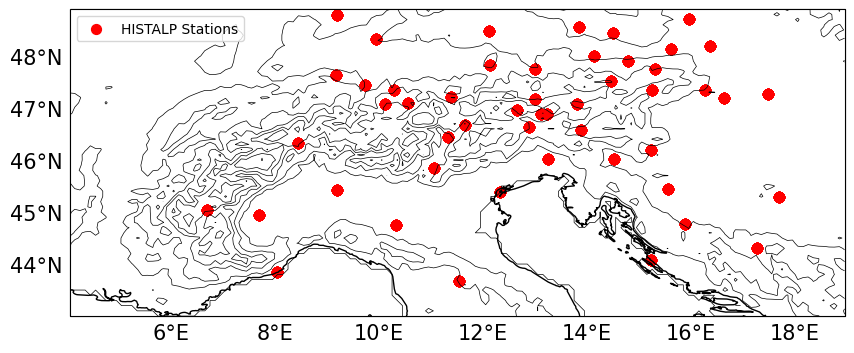

In [74]:
#Map of Closest points 

Histalp_stations_lon= Histalp_stations_df['longitude'].values
Histalp_stations_lat= Histalp_stations_df['latitude'].values

closest_Imerg_lon= Histalp_stations_df['closest_Imerg_lon'].values
closest_Imerg_lat= Histalp_stations_df['closest_Imerg_lat'].values

closest_chapter_lon= Histalp_stations_df['closest_chapter_lon'].values
closest_chapter_lat= Histalp_stations_df['closest_chapter_lat'].values

era5_Imerg_lon=era5_Imerg.lon.values
era5_Imerg_lat=era5_Imerg.lat.values
##############################
# Set up the map
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Add map features
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
ax.add_feature(cfeature.LAKES, facecolor='lightblue')
#ax.add_feature(cfeature.RIVERS)
ax.set_extent([np.min(era5_Imerg_lon), np.max(era5_Imerg_lon), np.min(era5_Imerg_lat), np.max(era5_Imerg_lat)], crs=ccrs.PlateCarree())



# Gridlines with larger font size and same color as title
title_color = '#000000'  # Title color
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, x_inline=False, y_inline=False, linewidth=0.33, color='k', alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlabel_style = {'size': 15, 'color': title_color}
gl.ylabel_style = {'size': 15, 'color': title_color}
# label height
levels = np.arange(0, 3000, 500)
ax = fig.add_subplot(projection=crs)
contour = ax.contour(era5_Imerg['lon'], era5_Imerg['lat'], era5_elev, levels, colors='k', linewidths=0.5)
ax.add_feature(cfeature.COASTLINE)




# Plot each dataset
ax.scatter(Histalp_stations_lon, Histalp_stations_lat, color='red', marker='o',s=50, label='HISTALP Stations')
#ax.scatter(closest_Imerg_lon, closest_Imerg_lat, color='red', marker='x',s=50, label='Closest IMERG Points')
#ax.scatter(closest_chapter_lon, closest_chapter_lat, color='blue', marker='^',s=50, label='Closest CHAPTER Points')
#ax.scatter(era5_Imerg_lon, era5_Imerg_lat, color='green', marker='s', label='ERA5 IMERG Grid')

# Add a legend
plt.legend(loc='upper left')

# Add title
plt.title('', fontsize=20, fontweight='bold', color=title_color)


plt.show()


In [75]:
# List to store the extracted precipitation values
all_chapter_month_stations = []

# Iterate over each unique closest_lat and closest_lon
for closest_lat, closest_lon in zip(lat_points, lon_points):
    # Compute squared distance
    dist = (chapter.XLAT.compute() - closest_lat) ** 2 + (chapter.XLONG.compute() - closest_lon) ** 2

    # Find the indices of the minimum distance
    i, j = np.unravel_index(dist.argmin(), dist.shape)

    # Extract the precipitation time series at the closest grid cell
    chapter_month_station = chapter_month.isel(south_north=i, west_east=j)

    # Store the extracted data along with coordinates
    all_chapter_month_stations.append(chapter_month_station)

# Combine results into a new xarray Dataset or DataArray if needed
chapter_month_stations = xr.concat(all_chapter_month_stations, dim="points")


#chapter_month_stations=chapter_month_stations.compute()


# Display the final dataset with all selected points
chapter_month_stations


<xarray.Dataset> Size: 95kB
Dimensions:      (points: 50, XTIME: 456)
Coordinates:
    XLONG        (points) float32 200B dask.array<chunksize=(1,), meta=np.ndarray>
    XLAT         (points) float32 200B dask.array<chunksize=(1,), meta=np.ndarray>
  * XTIME        (XTIME) datetime64[ns] 4kB 1983-01-01 1983-02-01 ... 2020-12-01
Dimensions without coordinates: points
Data variables:
    PREC_ACC_NC  (points, XTIME) float32 91kB dask.array<chunksize=(1, 1), meta=np.ndarray>
Attributes: (12/139)
    CDI:                             Climate Data Interface version 2.0.4 (ht...
    Conventions:                     CF-1.6
    TITLE:                            OUTPUT FROM WRF V4.1.1 MODEL
    START_DATE:                      1981-12-31_18:00:00
    SIMULATION_START_DATE:           1981-12-31_18:00:00
    WEST-EAST_GRID_DIMENSION:        1642
    ...                              ...
    HYBRID_OPT:                      2
    ETAC:                            0.2
    history:                         Fri Mar 07 11:41:21 2025: cdo -z zip_1 -...
    NCO:                             netCDF Operators version 4.9.3 (Homepage...
    frequency:                       day
    CDO:                             Climate Data Operators version 2.0.4 (ht...

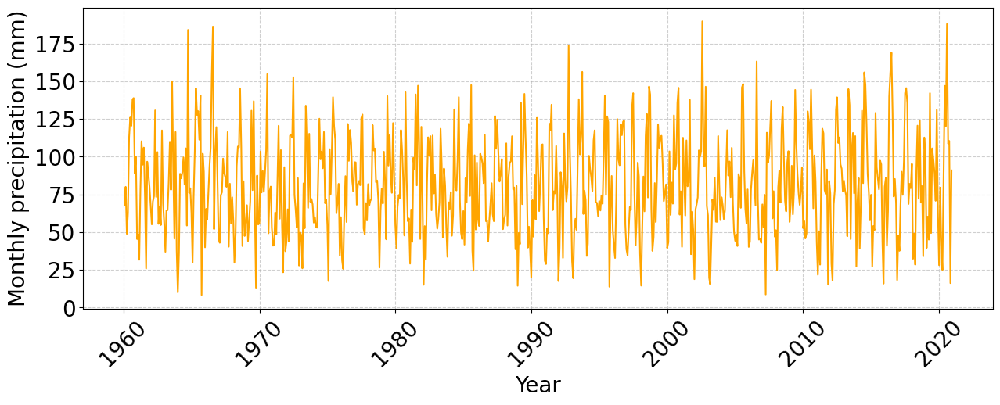

In [76]:
#Select Time
time_start='1960-01-01'   #'1960-01-01'   '1995-01-01'
time_end = '2020-12-31'   #'2020-12-31'   '2004-12-31'
########################################
plt.figure(figsize=(15, 5))

# Histalp Data (1960-2021) - Orange Solid Line
plt.plot(Histalp_df_long["Date"][(Histalp_df_long["Date"] > time_start) & (Histalp_df_long["Date"] < time_end)], Histalp_df_long["Value"][(Histalp_df_long["Date"] > time_start) & (Histalp_df_long["Date"] < time_end)], color='orange',
         linestyle='-', label='HISTALP')

# Formatting
plt.xlabel("Year", fontsize=20)
plt.ylabel("Monthly precipitation (mm)", fontsize=20)
plt.title("")

#plt.legend(loc='upper left', bbox_to_anchor=(1.01, 1), fontsize=15)
plt.xticks(rotation=45, fontsize=20)
plt.yticks(fontsize=20)
plt.grid(True, linestyle='--', alpha=0.6)

# Show the plot
plt.show()

In [77]:
era5_Imerg_filt_month_stations
Era5_ts = era5_Imerg_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='ERA5').reset_index()
Era5_ts

,time,ERA5
0,2001-01-01,94.098946
1,2001-02-01,68.526184
2,2001-03-01,147.995087
3,2001-04-01,122.538528
4,2001-05-01,85.522003
...,...,...
235,2020-08-01,180.058182
236,2020-09-01,112.918396
237,2020-10-01,155.090485
238,2020-11-01,28.083494


In [78]:
# Create DataFrames from the xarray DataArrays
Era5_ts1 = era5_Imerg_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='ERA5').reset_index()
Era5_ts2 = era5_backintime_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='ERA5').reset_index()
merged = Era5_ts1.merge(Era5_ts2, on='time', how='outer', suffixes=('_present', '_backintime'))
merged['ERA5_filled'] = merged['ERA5_present'].fillna(merged['ERA5_backintime'])
Era5_ts = merged[['time', 'ERA5_filled']].rename(columns={'ERA5_filled': 'ERA5'})
Era5_ts


,time,ERA5
0,1960-01-01,77.524651
1,1960-02-01,81.314186
2,1960-03-01,115.792175
3,1960-04-01,82.311562
4,1960-05-01,80.283279
...,...,...
727,2020-08-01,180.058182
728,2020-09-01,112.918396
729,2020-10-01,155.090485
730,2020-11-01,28.083494


In [79]:
#Select Time
time_start='1960-01-01'  
time_end = '2020-12-31'   
######################
HISTALP_ts = Histalp_df_long[(Histalp_df_long["Date"] >= time_start) & (Histalp_df_long["Date"] < time_end)][['Date', 'Value']].rename(columns={'Value': 'HISTALP'})
XGB_ts = era5_backintime_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='XGB').reset_index()
CHAPTER_ts = chapter_month_stations['PREC_ACC_NC'].sel(XTIME=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='CHAPTER').reset_index()
#######
Era5_ts1 = era5_Imerg_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='ERA5').reset_index()
Era5_ts2 = era5_backintime_filt_month_stations['ppt_era5'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='ERA5').reset_index()
merged = Era5_ts1.merge(Era5_ts2, on='time', how='outer', suffixes=('_present', '_backintime'))
merged['ERA5_filled'] = merged['ERA5_present'].fillna(merged['ERA5_backintime'])
Era5_ts = merged[['time', 'ERA5_filled']].rename(columns={'ERA5_filled': 'ERA5'})
##############################
XGB_ts1 = era5_Imerg_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='XGB').reset_index()
XGB_ts2 = era5_backintime_filt_month_stations['XGB'].sel(time=slice(time_start , time_end)).mean(dim="points").to_dataframe(name='XGB').reset_index()
merged = XGB_ts1.merge(XGB_ts2, on='time', how='outer', suffixes=('_present', '_backintime'))
merged['XGB_filled'] = merged['XGB_present'].fillna(merged['XGB_backintime'])
XGB_ts = merged[['time', 'XGB_filled']].rename(columns={'XGB_filled': 'XGB'})
##############################
merged = pd.merge(HISTALP_ts, Era5_ts, left_on='Date', right_on='time', how='left')
merged = pd.merge(merged, XGB_ts, left_on='Date', right_on='time', how='left')
#merged = pd.merge(merged, CHAPTER_ts, left_on='Date', right_on='XTIME', how='inner')
merged = pd.merge(merged, CHAPTER_ts, left_on='Date', right_on='XTIME', how='left')


merged['Era5-HIS']=merged['ERA5']-merged['HISTALP']
merged['XGB-HIS']=merged['XGB']-merged['HISTALP']
merged['CHAPTER-HIS']=merged['CHAPTER']-merged['HISTALP']
merged

,Date,HISTALP,time_x,ERA5,time_y,XGB,XTIME,CHAPTER,Era5-HIS,XGB-HIS,CHAPTER-HIS
0,1960-01-01,55.700000,1960-01-01,77.524651,1960-01-01,40.375744,NaT,NaN,21.824651,-15.324256,NaN
1,1960-02-01,67.820000,1960-02-01,81.314186,1960-02-01,51.927666,NaT,NaN,13.494186,-15.892334,NaN
2,1960-03-01,80.040000,1960-03-01,115.792175,1960-03-01,83.062637,NaT,NaN,35.752175,3.022637,NaN
3,1960-04-01,48.840000,1960-04-01,82.311562,1960-04-01,51.833961,NaT,NaN,33.471562,2.993961,NaN
4,1960-05-01,62.760000,1960-05-01,80.283279,1960-05-01,66.461266,NaT,NaN,17.523279,3.701266,NaN
...,...,...,...,...,...,...,...,...,...,...,...
727,2020-08-01,187.904762,2020-08-01,180.058182,2020-08-01,182.310699,2020-08-01,177.383453,-7.846580,-5.594062,-10.521309
728,2020-09-01,108.619048,2020-09-01,112.918396,2020-09-01,99.615967,2020-09-01,114.397453,4.299348,-9.003081,5.778406
729,2020-10-01,110.476190,2020-10-01,155.090485,2020-10-01,137.771423,2020-10-01,144.894760,44.614294,27.295233,34.418570
730,2020-11-01,16.190476,2020-11-01,28.083494,2020-11-01,25.723440,2020-11-01,21.710238,11.893018,9.532964,5.519761


In [80]:
#Errors
MAE_Era5 = np.mean(np.abs(merged['Era5-HIS']))
ME_Era5 = np.mean(merged['Era5-HIS']) 
print(MAE_Era5)
print(ME_Era5)
MAE_XGB = np.mean(np.abs(merged['XGB-HIS']))
ME_XGB = np.mean(merged['XGB-HIS']) 
print(MAE_XGB)
print(ME_XGB)
MAE_CHAPTER = np.mean(np.abs(merged['CHAPTER-HIS']))
ME_CHAPTER = np.mean(merged['CHAPTER-HIS']) 
print(MAE_CHAPTER)
print(ME_CHAPTER)

22.525213413770462
22.093692840478248
9.667456294192263
-0.4488779563423896
19.85859592801446
19.27564982634435


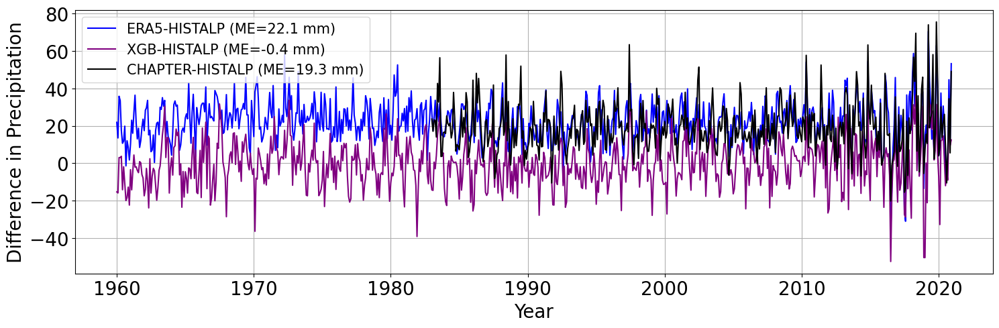

In [81]:
# Plot with specific colors
plt.figure(figsize=(15, 5))
plt.plot(merged['Date'], merged['Era5-HIS'], label=f'ERA5-HISTALP (ME={ME_Era5:.1f} mm)', color='blue')
plt.plot(merged['Date'], merged['XGB-HIS'], label=f'XGB-HISTALP (ME={ME_XGB:.1f} mm)', color='purple') 
plt.plot(merged['Date'], merged['CHAPTER-HIS'], label=f'CHAPTER-HISTALP (ME={ME_CHAPTER:.1f} mm)', color='black') 

# Labels and formatting
plt.xlabel('Year',fontsize=20)
plt.ylabel('Difference in Precipitation',fontsize=20)
plt.title('')
plt.legend(fontsize=15)
plt.xticks(fontsize=20) 
plt.yticks(fontsize=20)
plt.grid(True)
plt.tight_layout()
plt.show()

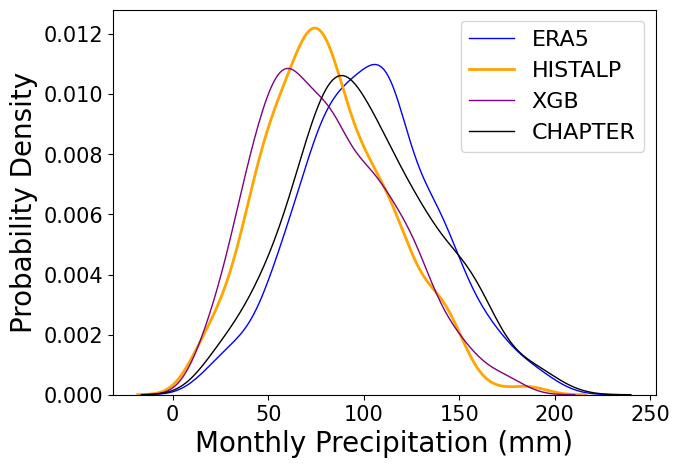

In [82]:
plt.figure(figsize=(7, 5))

sns.kdeplot(merged['ERA5'], color='blue', label='ERA5', linewidth=1)
sns.kdeplot(merged['HISTALP'], color='orange', label='HISTALP', linewidth=2)
sns.kdeplot(merged['XGB'], color='purple', label='XGB', linewidth=1)
sns.kdeplot(merged['CHAPTER'], color='black', label='CHAPTER', linewidth=1)

plt.xlabel('Monthly Precipitation (mm)', fontsize=20)
plt.ylabel('Probability Density', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=16)
plt.show()


In [83]:
#Select Time
time_start='1983-01-01'  
time_end = '2000-12-31' #'2000-12-31'   
# Step 1: Convert xarray to pandas DataFrame
B_df = chapter_month_stations['PREC_ACC_NC'].sel(XTIME=slice(time_start , time_end)) \
    .mean(dim="points") \
    .to_dataframe(name='B') \
    .reset_index()

# Step 2: Prepare Histalp data
A_df = Histalp_df_long[(Histalp_df_long["Date"] >= time_start) & 
                       (Histalp_df_long["Date"] < time_end)][['Date', 'Value']].rename(columns={'Value': 'A'})

# Step 3: Merge on Date
merged_pd = pd.merge(A_df, B_df, left_on='Date', right_on='XTIME', how='inner')

# Step 4: Compute RMSE
rmse_his_chapter_1983_2000 = np.sqrt(np.nanmean((merged_pd['A'] - merged_pd['B']) ** 2))
r2_his_chapter_1983_2000 = r2_score(merged_pd['A'], merged_pd['B'])
print('rmse_his_chapter_1983_2000: ', rmse_his_chapter_1983_2000)
print('r2_his_chapter_1983_2000: ', r2_his_chapter_1983_2000)


rmse_his_chapter_1983_2000:  22.341280496665323
r2_his_chapter_1983_2000:  0.5218573807859849


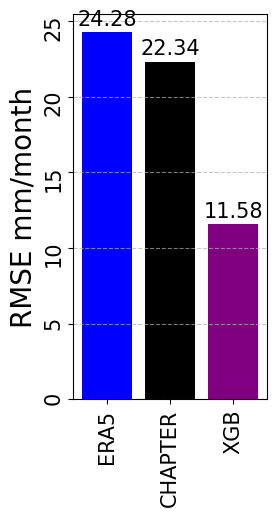

In [84]:
# Given RMSE values (replace with actual numbers)
rmse_values = [ rmse_his_era5_1960_2000, rmse_his_chapter_1983_2000, rmse_his_xgb_1960_2000]
labels = ['ERA5','CHAPTER', 'XGB' ]

# Create the plot
plt.figure(figsize=(2.5, 5))
plt.bar(labels, rmse_values, color=[ 'blue', 'black', 'purple'])  
plt.ylabel('RMSE mm/month', fontsize=20)
plt.title('')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels above bars
for i, value in enumerate(rmse_values):
    plt.text(i, value + 0.02 * max(rmse_values), f'{value:.2f}', ha='center', fontsize=15)

plt.xticks(rotation=90, fontsize=15)
plt.yticks(rotation=90, fontsize=15)
# Show the plot
plt.show()

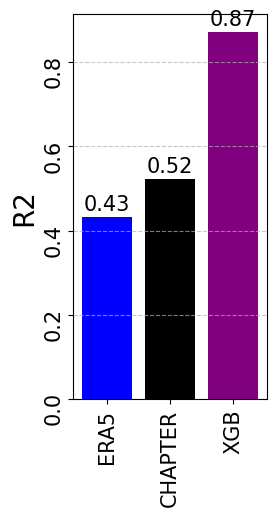

In [85]:
# Given RMSE values (replace with actual numbers)
r2_values = [ r2_his_era5_1960_2000, r2_his_chapter_1983_2000, r2_his_xgb_1960_2000]
labels = ['ERA5','CHAPTER', 'XGB' ]

# Create the plot
plt.figure(figsize=(2.5, 5))
plt.bar(labels, r2_values, color=[ 'blue', 'black', 'purple'])  
plt.ylabel('R2', fontsize=20)
plt.title('')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add value labels above bars
for i, value in enumerate(r2_values):
    plt.text(i, value + 0.02 * max(r2_values), f'{value:.2f}', ha='center', fontsize=15)

plt.xticks(rotation=90, fontsize=15)
plt.yticks(rotation=90, fontsize=15)
# Show the plot
plt.show()

save file

In [86]:
'''
era5_backintime = era5_backintime.chunk({'time': 365})
era5_Imerg = era5_Imerg.chunk({'time': 365})

# Concatenate safely (lazy with Dask)
merged = xr.concat([era5_backintime, era5_Imerg.drop_vars('custom_dayofyear', errors='ignore')], dim='time')

# Save to NetCDF (on disk, lazy execution)
merged['XGB'].to_netcdf("ML_IMEX20250722.nc", engine="netcdf4", compute=True)

ML_IMEX = xr.open_dataset(f"{path}/ML_IMEX20250722.nc")
print(np.isnan(ML_IMEX['XGB'].values.flatten()).sum())

##############Saving All necessary variables###############################
merged2 = merged.drop_vars(['sp', 'tcwv', 'time_bnds', 'p71.162', 'cape', 'tp_NearestN','t', 'u', 'v', 'Seasonal Mask', 'Rain/No rain threshold','Imerg P with threshold', 'Train/Valid/Test indices'])
merged2.to_netcdf("ML_IMEX_allvar_20250722.nc", engine="netcdf4", compute=True)
ML_IMEX = xr.open_dataset(f"{path}/ML_IMEX_allvar_20250722.nc")
'''

'\nera5_backintime = era5_backintime.chunk({\'time\': 365})\nera5_Imerg = era5_Imerg.chunk({\'time\': 365})\n\n# Concatenate safely (lazy with Dask)\nmerged = xr.concat([era5_backintime, era5_Imerg.drop_vars(\'custom_dayofyear\', errors=\'ignore\')], dim=\'time\')\n\n# Save to NetCDF (on disk, lazy execution)\nmerged[\'XGB\'].to_netcdf("ML_IMEX20250722.nc", engine="netcdf4", compute=True)\n\nML_IMEX = xr.open_dataset(f"{path}/ML_IMEX20250722.nc")\nprint(np.isnan(ML_IMEX[\'XGB\'].values.flatten()).sum())\n\n##############Saving All necessary variables###############################\nmerged2 = merged.drop_vars([\'sp\', \'tcwv\', \'time_bnds\', \'p71.162\', \'cape\', \'tp_NearestN\',\'t\', \'u\', \'v\', \'Seasonal Mask\', \'Rain/No rain threshold\',\'Imerg P with threshold\', \'Train/Valid/Test indices\'])\nmerged2.to_netcdf("ML_IMEX_allvar_20250722.nc", engine="netcdf4", compute=True)\nML_IMEX = xr.open_dataset(f"{path}/ML_IMEX_allvar_20250722.nc")\n'

In [ ]:
ds = xr.open_dataset(f"{path}/ERA5_NearestN/{var}_{year}_NearestN.nc") #bsh_NearestN mapping(1,2)
ds=xr.open_dataset(f"{path}/ERA5_NearestN/{var}_daymean_{year}_NearestN.nc") (1984,2001): #bsh_NearestN mapping(1,2)

ds=xr.open_dataset(f"{path}/ERA5_hourly_backintime/{var}_{year}_daymean_NN.nc")1960,1984): #bsh_backintime_2
ds=xr.open_dataset(f"{path}/ERA5_hourly_backintime/{var}_{year}_daysum_consmap.nc")(1960,1984):#bsh_backintime_2
    
ds = xr.open_dataset(f"{path}/ERA5_consmap/total_precipitation_daycum_{year}_consmap.nc") #bsh_ERA5_consmap_tp

ds = xr.open_dataset(f"{path}/IMERG7_CDO/CDO_Precipitation_3B-DAY.MS.MRG.3IMERG.{i}-S000000-E235959.V07B.nc4" #bsh_conservative mapping
                     
file_list = [os.path.join(path, "QI_CDO", f) for f in os.listdir(os.path.join(path, "QI_CDO")) if f.endswith('.nc4')]
file_list = [os.path.join(f"{path}/CHAPTER", f) for f in os.listdir(f"{path}/CHAPTER") if f.endswith('.nc')]
#ds = xr.open_dataset(f"{path}/ETOPO_2022_v1_30s_N90W180_surface_Imerg_conservative_remapped.nc", engine="netcdf4")   #downloaded from grecale
#data_dir = f"{path}/HISTALP_stations/HISTALP_{loc}_R01_1760_2025.csv"